# Human Connectome Project (HCP) 

The HCP dataset comprises resting-state and task-based fMRI from a large sample of human subjects. The NMA-curated dataset includes time series data that has been preprocessed and spatially-downsampled by aggregating within 360 regions of interest.

In [69]:
import os

In [70]:
import numpy as np
import matplotlib.pyplot as plt

In [71]:
import sklearn
sklearn.__version__

'1.0.2'

In [72]:
# Necessary for visualization
from nilearn import plotting, datasets

In [73]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

# Basic parameters

In [74]:
# The download cells will store the data in nested directories starting here:
HCP_DIR = "./hcp"
if not os.path.isdir(HCP_DIR):
  os.mkdir(HCP_DIR)

# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 339

# The data have already been aggregated into ROIs from the Glasesr parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in sec

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated multiple times in each subject
N_RUNS_REST = 4
N_RUNS_TASK = 2

# Time series data are organized by experiment, with each experiment
# having an LR and RL (phase-encode direction) acquistion
BOLD_NAMES = [
  "rfMRI_REST1_LR", "rfMRI_REST1_RL",
  "rfMRI_REST2_LR", "rfMRI_REST2_RL",
  "tfMRI_MOTOR_RL", "tfMRI_MOTOR_LR",
  "tfMRI_WM_RL", "tfMRI_WM_LR",
  "tfMRI_EMOTION_RL", "tfMRI_EMOTION_LR",
  "tfMRI_GAMBLING_RL", "tfMRI_GAMBLING_LR",
  "tfMRI_LANGUAGE_RL", "tfMRI_LANGUAGE_LR",
  "tfMRI_RELATIONAL_RL", "tfMRI_RELATIONAL_LR",
  "tfMRI_SOCIAL_RL", "tfMRI_SOCIAL_LR"
]

# You may want to limit the subjects used during code development.
# This will use all subjects:
subjects = range(N_SUBJECTS)

# Downloading data

The rest and task data are shared in different files, but they will unpack into the same directory structure.

Each file is fairly large and will take some time to download. If you are focusing only on rest or task analyses, you may not want to download only that dataset.

We also separately provide some potentially useful behavioral covariate information.

In [75]:
fname = "hcp_rest.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/bqp7m/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [76]:
fname = "hcp_task.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/s4h8j/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [77]:
fname = "hcp_covariates.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/x5p4g/download/
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

In [78]:
fname = f"{HCP_DIR}/atlas.npz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/j5kuc/download

## Loading region information

Downloading either dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel.

Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).

Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).

In [79]:
regions = np.load(f"{HCP_DIR}/regions.npy").T
region_info = dict(
    name=regions[0].tolist(),
    network=regions[1],
    myelin=regions[2].astype(np.float),
)
number = 140
print(region_info["name"][number])
print(region_info["network"][number])

R_TPOJ3
Dorsal-atten


We also provide the [parcellation on the fsaverage5 surface](https://figshare.com/articles/HCP-MMP1_0_projected_on_fsaverage/3498446) and approximate MNI coordinates of each region, which can be useful for visualization:

In [80]:
with np.load(f"{HCP_DIR}/atlas.npz") as dobj:
  atlas = dict(**dobj)

# Helper functions


## Data loading

In [81]:
def get_image_ids(name):
  """Get the 1-based image indices for runs in a given experiment.

    Args:
      name (str) : Name of experiment ("rest" or name of task) to load
    Returns:
      run_ids (list of int) : Numeric ID for experiment image files

  """
  run_ids = [
    i for i, code in enumerate(BOLD_NAMES, 1) if name.upper() in code
  ]
  if not run_ids:
    raise ValueError(f"Found no data for '{name}''")
  return run_ids

def load_timeseries(subject, name, runs=None, concat=True, remove_mean=True):
  """Load timeseries data for a single subject.
  
  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of experiment ("rest" or name of task) to load
    run (None or int or list of ints): 0-based run(s) of the task to load,
      or None to load all runs.
    concat (bool) : If True, concatenate multiple runs in time
    remove_mean (bool) : If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_tp array): Array of BOLD data values

  """
  # Get the list relative 0-based index of runs to use
  if runs is None:
    runs = range(N_RUNS_REST) if name == "rest" else range(N_RUNS_TASK)
  elif isinstance(runs, int):
    runs = [runs]

  # Get the first (1-based) run id for this experiment 
  offset = get_image_ids(name)[0]

  # Load each run's data
  bold_data = [
      load_single_timeseries(subject, offset + run, remove_mean) for run in runs
  ]  
  # [run1 (360,274),run2(360,274)]

  # Optionally concatenate in time
  if concat:
    bold_data = np.concatenate(bold_data, axis=-1)

  return bold_data


def load_single_timeseries(subject, bold_run, remove_mean=True):
  """Load timeseries data for a single subject and single run.
  
  Args:
    subject (int): 0-based subject ID to load
    bold_run (int): 1-based run index, across all tasks
    remove_mean (bool): If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_timepoint array): Array of BOLD data values

  """
  bold_path = f"{HCP_DIR}/subjects/{subject}/timeseries"
  bold_file = f"bold{bold_run}_Atlas_MSMAll_Glasser360Cortical.npy"
  ts = np.load(f"{bold_path}/{bold_file}")
  if remove_mean:
    ts -= ts.mean(axis=1, keepdims=True)
  return ts

def load_evs(subject, name, condition):
  """Load EV (explanatory variable) data for one task condition.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of task
    condition (str) : Name of condition

  Returns
    evs (list of dicts): A dictionary with the onset, duration, and amplitude
      of the condition for each run.

  """
  evs = []
  for id in get_image_ids(name):
    task_key = BOLD_NAMES[id - 1]
    ev_file = f"{HCP_DIR}/subjects/{subject}/EVs/{task_key}/{condition}.txt"
    ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
    ev = dict(zip(["onset", "duration", "amplitude"], ev_array))
    evs.append(ev)
  return evs

## Task-based analysis

In [82]:
def condition_frames(run_evs, skip=0):
  """Identify timepoints corresponding to a given condition in each run.

  Args:
    run_evs (list of dicts) : Onset and duration of the event, per run
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    frames_list (list of 1D arrays): Flat arrays of frame indices, per run

  """
  frames_list = []
  for ev in run_evs:

    # Determine when trial starts, rounded down
    start = np.floor(ev["onset"] / TR).astype(int)

    # Use trial duration to determine how many frames to include for trial
    duration = np.ceil(ev["duration"] / TR).astype(int)

    # Take the range of frames that correspond to this specific trial
    frames = [s + np.arange(skip, d) for s, d in zip(start, duration)]

    frames_list.append(np.concatenate(frames))

  return frames_list


def selective_average(timeseries_data, ev, skip=0):
  """Take the temporal mean across frames for a given condition.

  Args:
    timeseries_data (array or list of arrays): n_parcel x n_tp arrays
    ev (dict or list of dicts): Condition timing information
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    avg_data (1D array): Data averagted across selected image frames based
    on condition timing

  """
  # Ensure that we have lists of the same length
  if not isinstance(timeseries_data, list):
    timeseries_data = [timeseries_data]
  if not isinstance(ev, list):
    ev = [ev]
  if len(timeseries_data) != len(ev):
    raise ValueError("Length of `timeseries_data` and `ev` must match.")

  # Identify the indices of relevant frames
  frames = condition_frames(ev, skip)

  # Select the frames from each image
  selected_data = []
  for run_data, run_frames in zip(timeseries_data, frames):
    run_frames = run_frames[run_frames < run_data.shape[1]]
    selected_data.append(run_data[:, run_frames])

  # Take the average in each parcel
  avg_data = np.concatenate(selected_data, axis=-1).mean(axis=-1)

  return avg_data

# Resting-state analyses

Load a single run of resting-state data:

In [83]:
help(load_timeseries)

Help on function load_timeseries in module __main__:

load_timeseries(subject, name, runs=None, concat=True, remove_mean=True)
    Load timeseries data for a single subject.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of experiment ("rest" or name of task) to load
      run (None or int or list of ints): 0-based run(s) of the task to load,
        or None to load all runs.
      concat (bool) : If True, concatenate multiple runs in time
      remove_mean (bool) : If True, subtract the parcel-wise mean
    
    Returns
      ts (n_parcel x n_tp array): Array of BOLD data values



In [84]:
timeseries = load_timeseries(subject=0, name="rest", runs=1)
print(timeseries.shape)  # n_parcel x n_timepoint

(360, 1200)


Load a concatenated resting-state timeseries (using all runs' data) for each subject:

In [85]:
timeseries_rest = []
for subject in subjects:
  ts_concat = load_timeseries(subject, "rest")
  timeseries_rest.append(ts_concat)

In [86]:
print(np.array(timeseries_rest).shape)

(339, 360, 4800)


## Run a simple correlation-based "functional connectivity" analysis

Generate a correlation matrix (showing "functional connectivity" or FC) for each subject and plot the group average:

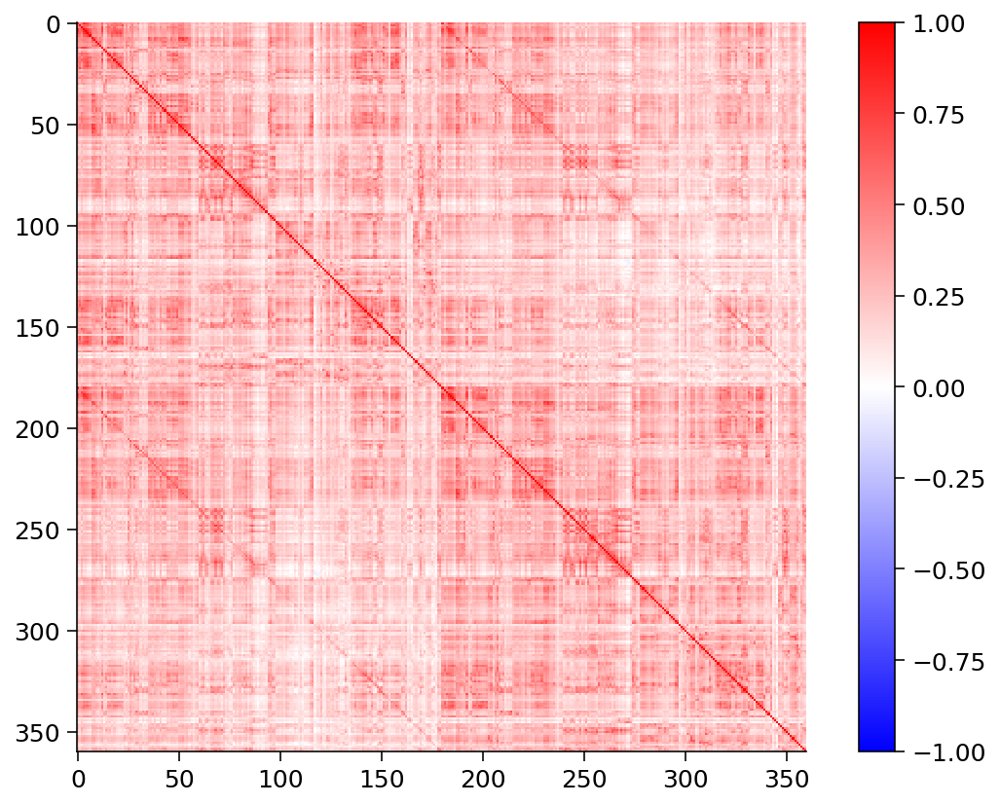

(339, 360, 4800)


In [87]:
from mpl_toolkits import mplot3d
fc = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
for sub, ts in enumerate(timeseries_rest):
  fc[sub] = np.corrcoef(ts)

group_fc = fc.mean(axis=0)

plt.imshow(group_fc, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
plt.colorbar()
plt.show()

print(np.array(timeseries_rest).shape)

Plot the profile of FC values between a particular "seed" parcel and every parcel in the dataset, separated by hemisphere:

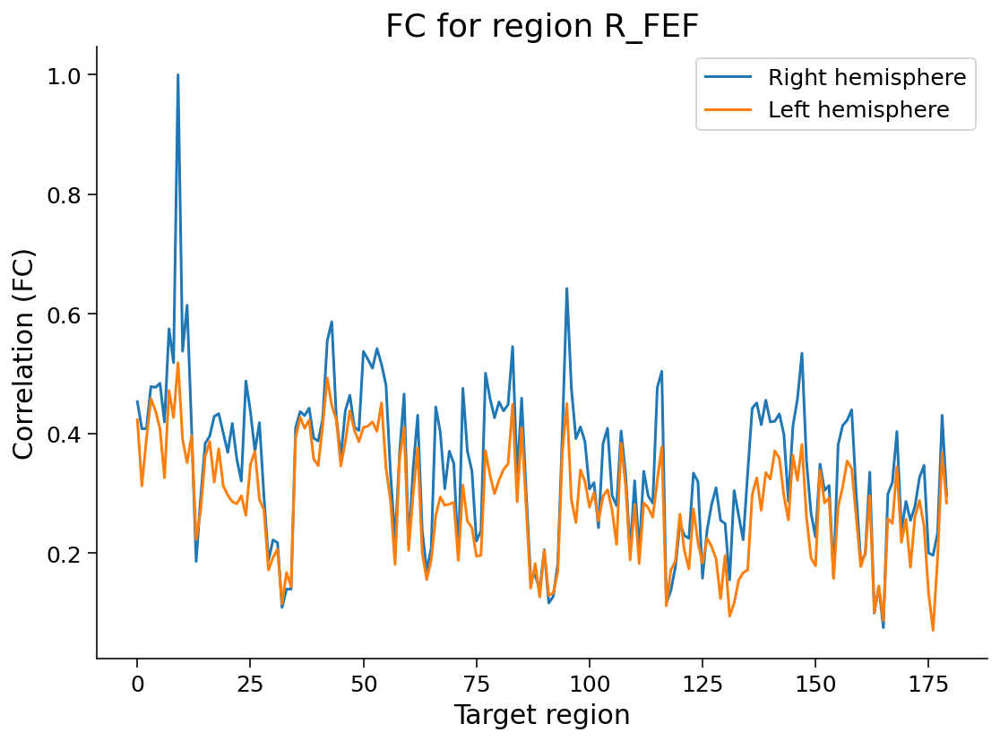

In [88]:
seed_roi = "R_FEF"  # name of seed parcel
ind = region_info["name"].index(seed_roi)

hemi_fc = np.split(group_fc, 2)

# Plot the FC profile across the right and left hemisphere target regions
for i, hemi_fc in enumerate(hemi_fc):
  plt.plot(hemi_fc[:, ind], label=f"{HEMIS[i]} hemisphere")
plt.title(f"FC for region {seed_roi}")
plt.xlabel("Target region")
plt.ylabel("Correlation (FC)")
plt.legend()
plt.show()

Threshold the correlation matrix to produce a connectome, and plot it:

In [89]:
plotting.view_connectome(group_fc, atlas["coords"], edge_threshold="99%")

# Behavioral covariates


## Task performance measures

The dataset also includes aggregate behavior for each task run stored in task-specific `.csv` files. It is possible to load and work with these files using `numpy`:

In [90]:
social_behavior = np.genfromtxt("hcp/behavior/social.csv",
                            delimiter=",",
                            names=True,
                            dtype=None,
                            encoding="utf")
print(social_behavior[:5])
print(social_behavior.dtype.names)

[(0, 0, 'RANDOM',  866.5,    nan, nan, 0., 1., 0., 0.)
 (0, 0, 'TOM',    nan, 1090. , nan, 0., 0., 1., 0.)
 (0, 1, 'RANDOM', 1355. ,    nan, nan, 0., 1., 0., 0.)
 (0, 1, 'TOM',    nan, 1619.5, nan, 0., 0., 1., 0.)
 (1, 0, 'RANDOM',  452. ,    nan, nan, 0., 1., 0., 0.)]
('Subject', 'Run', 'ConditionName', 'MEDIAN_RT_RANDOM', 'MEDIAN_RT_TOM', 'MEDIAN_RT_UNSURE', 'PROP_NLR', 'PROP_RANDOM', 'PROP_TOM', 'PROP_UNSURE')


But, while not formally taught as part of the course, [`pandas`](https://pandas.pydata.org/) offers more powerful tools for tabular data analysis.

## Pseudo-demographics

The NMA-distributed version of the HCP data does not contain any real demographic information. But we have created a synthetic dataset of 25 "demographic" variables based on a model trained on the original dataset to predict demographics from resting-state network organization measures:

In [91]:
demo = np.load("hcp/pseudo_demographics.npy")
demo.shape

(339, 25)

## Original subject IDs

The dataset also contains a key to map the ordinal subject numbers to the IDs used in the original HCP dataset:

In [92]:
ids = np.loadtxt("hcp/orig_ids.txt")
print(ids[:8])

[199453. 580751. 173435. 919966. 181636. 192843. 894067. 174437.]


# Identifying regions for Mentalizing using Subtraction Analysis

## A. Between BOLD data of mental and random condition of videos

Description of each task, task timing, and conditions is located [here](https://protocols.humanconnectome.org/HCP/3T/task-fMRI-protocol-details.html).

These are the condition names for each task:

```
- MOTOR: cue, lf, lh, rf, rh, t
- WM:
    0bk_body, 0bk_faces, 0bk_nir, 0bk_placed, 0bk_tools, 
    2bk_body, 2bk_faces, 2bk_nir, 2bk_placed, 2bk_tools,
    0bk_cor, 0bk_err,
    2bk_cor, 2bk_err,
    all_bk_cor, all_bk_err
- EMOTION: feat, neutral
- GAMBLING: loss, loss_event, win, win_event, neut_event
- LANGUAGE:
    cue,
    math, story
    present_math, present_story,
    question_math, question_story,
    response_math, response_story
- RELATIONAL: error, match, relation
- SOCIAL: mental_resp, mental, other_resp, rnd
```

Load each subject's data for a specific task, separately for each run:

In [93]:
timeseries_task = []
for subject in subjects:
  timeseries_task.append(load_timeseries(subject, "social", concat=False))

tim = load_timeseries(0, "social", concat=False)
print(tim)

[array([[ 121.14051095,  104.34051095,   91.04051095, ...,  -70.15948905,
         -91.85948905, -139.25948905],
       [-152.27959854, -159.69959854,  -93.13959854, ...,  -11.08959854,
         -76.31959854,  -96.76959854],
       [ 132.76970803,  131.26970803,    8.86970803, ...,   93.36970803,
          39.86970803,   90.96970803],
       ...,
       [ 229.93175182,  114.83175182,   78.33175182, ...,   29.93175182,
         -66.26824818,  125.93175182],
       [ 113.68941606,  105.48941606,   48.88941606, ...,  -70.41058394,
          38.58941606,  -47.31058394],
       [ 104.00620438,  206.30620438,  247.90620438, ...,   39.40620438,
         -63.89379562, -123.29379562]]), array([[  17.2270073 ,  -14.6729927 ,  -83.8729927 , ...,  -61.8729927 ,
         -78.4729927 , -109.6729927 ],
       [ -62.9830292 , -127.5030292 , -108.4230292 , ...,  -20.3430292 ,
         -72.9130292 ,  -32.7730292 ],
       [  89.23941606,   72.03941606,   52.73941606, ...,   -4.16058394,
          88.539

In [94]:
help(load_evs)

Help on function load_evs in module __main__:

load_evs(subject, name, condition)
    Load EV (explanatory variable) data for one task condition.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of task
      condition (str) : Name of condition
    
    Returns
      evs (list of dicts): A dictionary with the onset, duration, and amplitude
        of the condition for each run.



In [95]:
help(selective_average)

Help on function selective_average in module __main__:

selective_average(timeseries_data, ev, skip=0)
    Take the temporal mean across frames for a given condition.
    
    Args:
      timeseries_data (array or list of arrays): n_parcel x n_tp arrays
      ev (dict or list of dicts): Condition timing information
      skip (int) : Ignore this many frames at the start of each trial, to account
        for hemodynamic lag
    
    Returns:
      avg_data (1D array): Data averagted across selected image frames based
      on condition timing



In [96]:
## A. THIS CALCULATES CONTRAST OF MENTAL and RANDOM CLASSES OF VIDEOS
task = "social"
conditions = ["mental", "rnd"]  # Run a substraction analysis between two conditions

contrast_a = []

for subject in subjects:

  # Get the average signal in each region for each condition
  evs = [load_evs(subject, task, cond) for cond in conditions]
  avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]

  # Store the region-wise difference
  contrast_a.append(avgs[0] - avgs[1])

group_contrast_a = np.mean(contrast_a, axis=0)
print(group_contrast_a.shape)
print(np.array(avgs).shape)

(360,)
(2, 360)


Plot group-averaged contrast value across regions:

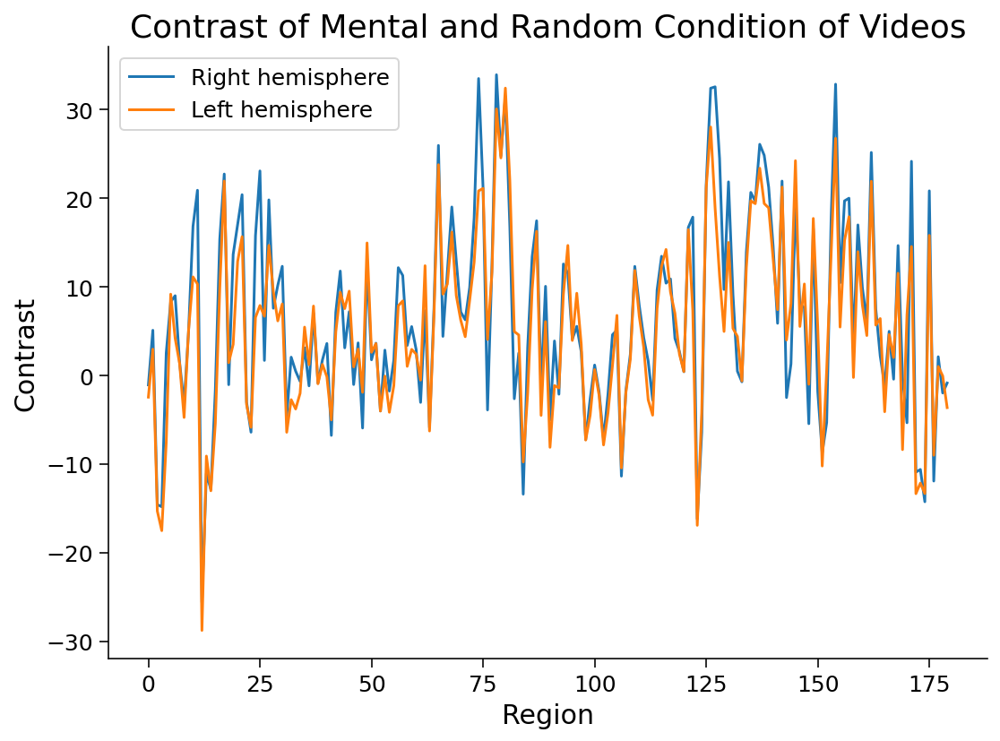

In [97]:
hemi_contrasts_a = np.split(group_contrast_a, 2)

for i, hemi_contrast_a in enumerate(hemi_contrasts_a):
  plt.plot(hemi_contrast_a, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of Mental and Random Condition of Videos")
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()
# print(np.array(hemi_contrasts).shape)

Plot the regional values on the surface of one hemisphere:

In [98]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast_a = group_contrast_a[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast_a,
                   vmax=15)

Functional Analysis:
Average the contrast values within parcels belonging to each network and plot:

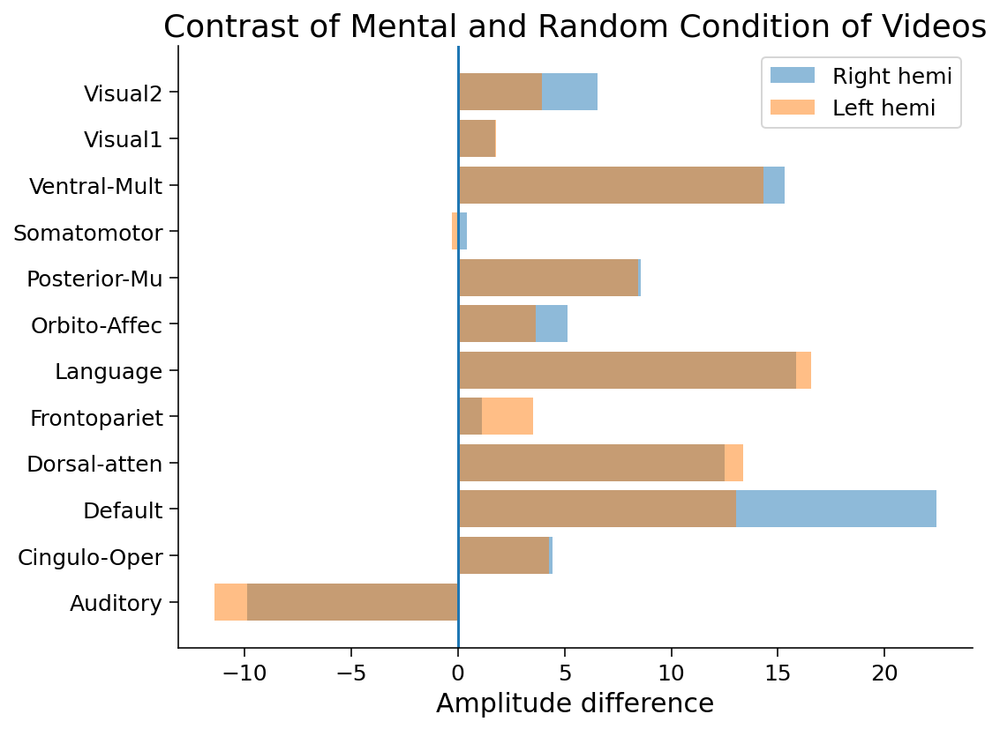

In [99]:
# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contrasts = np.split(group_contrast_a, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contrast in zip(HEMIS, hemi_networks, hemi_contrasts):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contrast[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title("Contrast of Mental and Random Condition of Videos")
plt.legend()
plt.show()

## B. Between BOLD data of subjects preceving mental interaction (in mental condition) and those perceving random (in random condition)



In [100]:
import pandas

Nomenclature of BOLD respnses for both conditions

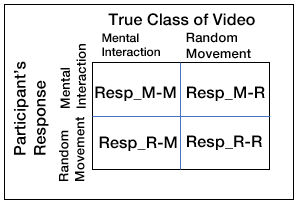

In [101]:
## B. THIS CALCULATES CONTRAST OF Resp_M-M and Resp_R-R

task = "social"
# conditions = ["mental", "rnd"]  # Run a substraction analysis between two conditions

social_data = []
social_data = pandas.read_csv("hcp/behavior/social.csv")
social_data = social_data.to_numpy()

#Initializing time series
r = np.zeros((360,274))
timeseries_random_b = [[r,r]]*339
timeseries_mental_b = [[r,r]]*339

#Initializing average bold values list for both mental and random
avgs_random_b = []
avgs_mental_b = []

#Initializing contrast for Case B
contra_b = []

final_timeseries_corr = [0]*339
final_timeseries_random = [0]*339

for subject in subjects:
  ind = int(subject+subject*3)
  # sub =sub.to_numpy()
  sub = social_data[ind:ind+4,0:10]

  evs_random = [load_evs(subject, "social", "rnd")]
  cond_frame_rnd_0 = condition_frames([load_evs(0, "social", "rnd")[0]])[0]
  cond_frame_rnd_1 = condition_frames([load_evs(0, "social", "rnd")[1]])[0]

  evs_mental = [load_evs(subject, "social", "mental")]
  cond_frame_mental_0 = condition_frames([load_evs(0, "social", "mental")[0]])[0]
  cond_frame_mental_1 = condition_frames([load_evs(0, "social", "mental")[1]])[0]


  if sub[0][1]==0 & bool(sub[0][2]=="RANDOM"):
      if sub[0][7]>0.60:  
        timeseries_random_b[subject][0] = np.array(load_timeseries(subject, "social", concat=False, runs=0)[0][:,cond_frame_rnd_0])

  if sub[1][1]==0 & bool(sub[1][2]=="TOM"):
      if sub[1][8]>0.60:  
        timeseries_mental_b[subject][0] = np.array(load_timeseries(subject, "social", concat=False, runs=0)[0][:,cond_frame_mental_0])
  
  if sub[2][1]==1 & bool(sub[2][2]=="RANDOM"):
      if sub[2][7]>0.60:  
        timeseries_random_b[subject][1] = np.array(load_timeseries(subject, "social", concat=False, runs=1)[0][:,cond_frame_rnd_1])
        
  if sub[3][1]==1 & bool(sub[3][2]=="TOM"):
      if sub[3][8]>0.60:  
        timeseries_mental_b[subject][1] =  np.array(load_timeseries(subject, "social", concat=False, runs=1)[0][:,cond_frame_mental_1])
  
  avgs_random_b.append([selective_average(timeseries_random_b[subject], ev) for ev in evs_random]) #for subject for run 0 for random

  avgs_mental_b.append([selective_average(timeseries_mental_b[subject], ev) for ev in evs_mental])

  #Also saving concatenated time series across subjects of in Resp_M-M condition time series
  final_timeseries_corr[subject] = np.concatenate((timeseries_mental_b[subject][0],timeseries_mental_b[subject][1]),axis=1)
  final_timeseries_random[subject] = np.concatenate((timeseries_random_b[subject][0],timeseries_random_b[subject][1]),axis=1)


for k in subjects:
  avgs_random_b[k] = np.reshape(np.array(avgs_random_b[k]),(360,1))
  avgs_mental_b[k] = np.reshape(np.array(avgs_mental_b[k]),(360,1))

avgs_r_b = np.mean(avgs_random_b, axis=0)
avgs_m_b = np.mean(avgs_mental_b, axis=0)   

# print(condition_frames([load_evs(0, "social", "rnd")[0]])[0])


In [102]:
#Calculating contrast between Resp_M-M and Resp_R-R
contra_b = avgs_m_b - avgs_r_b

In [103]:
print(contra_b.shape)

(360, 1)


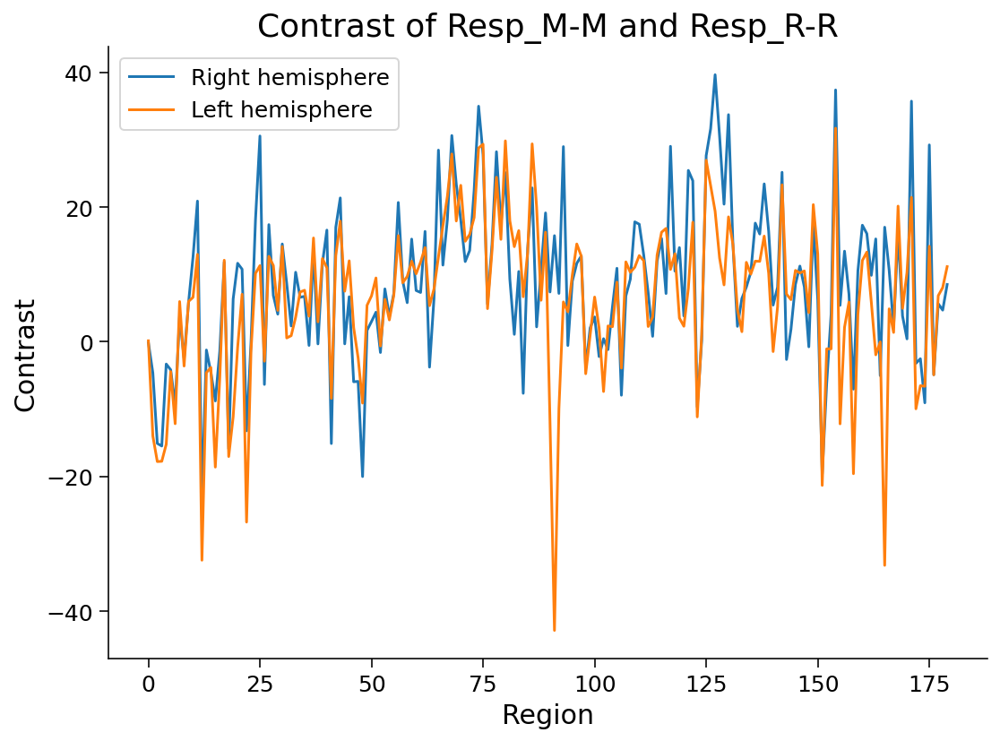

In [104]:
hemi_contra_b = np.split(contra_b, 2)

for i, hemi_contra_b in enumerate(hemi_contra_b):
  plt.plot(hemi_contra_b, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of Resp_M-M and Resp_R-R")
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

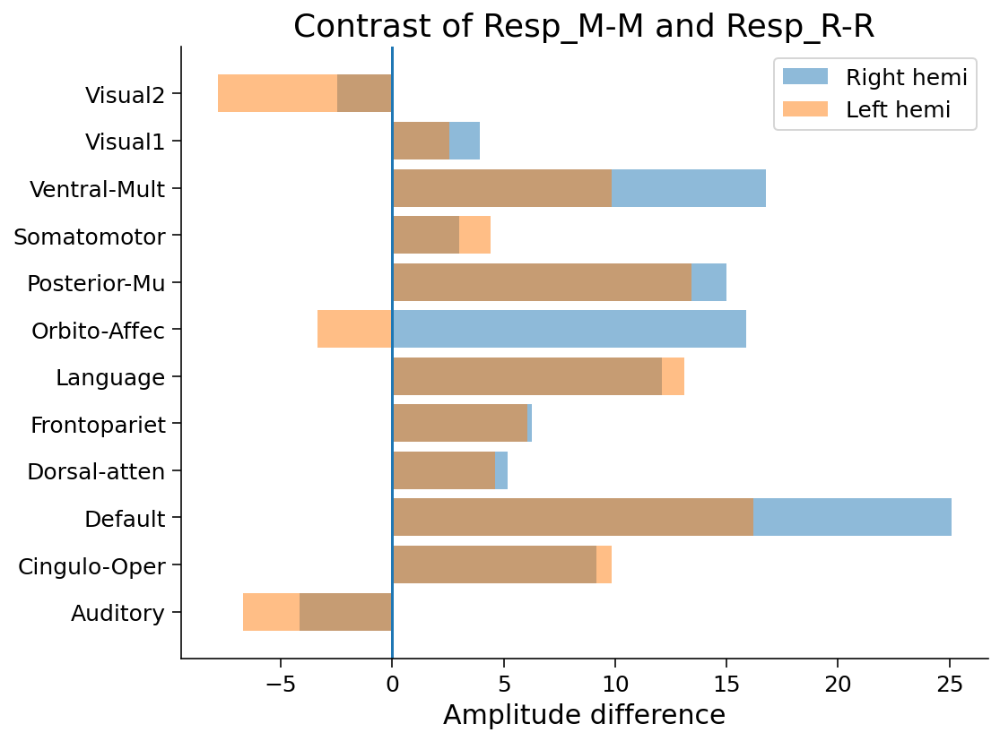

In [105]:
# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contra_b = np.split(contra_b, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contra_b in zip(HEMIS, hemi_networks, hemi_contra_b):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contra_b[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title("Contrast of Resp_M-M and Resp_R-R")
plt.legend()
plt.show()

In [106]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast_b = contra_b[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast_b,
                   vmax=15)

### B.1. Functional connectivity using Correlation Analysis

Functional Connectivity using Correlation Analysis :

(339, 360, 160)
(36, 160)


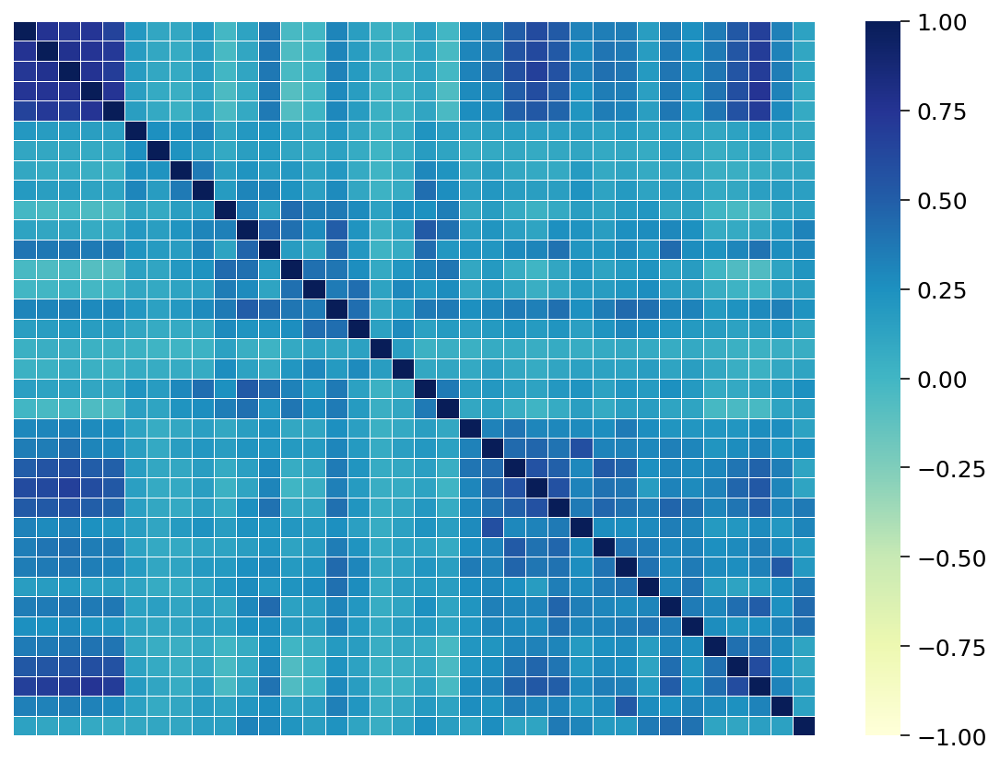

In [107]:
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib as mpl

#Parcels which are relevant for social cognition task
rel_parcels = [24,27,56,57,58,59,60,61,62,63,64,68,87,122,124,127,128,129,130,131,132,133,134,135,136,138,139,140,163,164,171,174,175,176,178,179]

#Parcels which are relevant for social cognition task, arranged region wise as "Temporal-Parie-Occi-Junction","medial Prefrontal Cortex","Auditory Association" and "Lateral Temporal"
rel_parcels_regionwise = [24,27,138,139,140,56,57,58,59,60,61,62,63,64,68,87,163,164,178,179,122,124,127,128,129,174,175,130,131,132,133,134,135,136,171,176]

#Checking shape of time series 
print(np.array(final_timeseries_corr).shape)

#Initializing functional connectivity matrix for our parcels in Resp_M-M condition
fc_perc_mental = np.zeros((N_SUBJECTS, len(rel_parcels), len(rel_parcels)))

print(np.array(final_timeseries_corr[0][rel_parcels,:]).shape)

#Calculating correlations between parcels
for sub, ts in enumerate(final_timeseries_corr):
  ts = ts[rel_parcels_regionwise,:]
  fc_perc_mental[sub] = np.corrcoef(ts)

#Calculating mean across frames
group_fc_per_mental = fc_perc_mental.mean(axis=0)

#Plotting heatmap
p = sns.heatmap(group_fc_per_mental, annot=False,cmap="YlGnBu", fmt=".1f",annot_kws={'size':16},linewidths=.5,vmin=-1, vmax=1, xticklabels=False, yticklabels=False)
plt.show()

In [108]:
# Statistical analysis of correlations
import scipy.stats

print(np.array(final_timeseries_corr).shape)

mean_across_sub = (np.array(final_timeseries_corr)).mean(axis=0)

#Parcels which are relevant for social cognition task, arranged region wise as "Temporal-Parie-Occi-Junction","medial Prefrontal Cortex","Auditory Association" and "Lateral Temporal"
rel_parcels_regionwise = [24,27,138,139,140,56,57,58,59,60,61,62,63,64,68,87,163,164,178,179,122,124,127,128,129,174,175,130,131,132,133,134,135,136,171,176]

tpj_junction =[24,27,138,139,140]
med_prefrontal = [56,57,58,59,60,61,62,63,64,68,87,163,164,178,179]
aud_assoc = [122,124,127,128,129,174,175]
lat_temporal = [130,131,132,133,134,135,136,171,176]

mean_across_sub_tpj = mean_across_sub[tpj_junction,:]
mean_across_sub_pref = mean_across_sub[med_prefrontal,:]
mean_across_sub_aud = mean_across_sub[aud_assoc,:]
mean_across_sub_temp = mean_across_sub[lat_temporal,:]

#note - taking mean across parcels.. so that correlation between same no of time fraame activity could be checked between regions
mean_across_sub_time_tpj = mean_across_sub_tpj.mean(axis=0)
mean_across_sub_time_pref = mean_across_sub_pref.mean(axis=0)
mean_across_sub_time_aud = mean_across_sub_aud.mean(axis=0)
mean_across_sub_time_temp = mean_across_sub_temp.mean(axis=0)

scipy.stats.pearsonr(mean_across_sub_time_tpj, mean_across_sub_time_temp)

# scipy.stats.spearmanr(mean_across_sub_time_regionvise, mean_across_sub_time_regionvise)

# scipy.stats.kendalltau(mean_across_sub_time_regionvise, mean_across_sub_time_regionvise)

(339, 360, 160)


(0.9112449886888211, 9.396511561776061e-63)

In [109]:
plotting.view_connectome(group_fc_per_mental, atlas["coords"], edge_threshold="80%")

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\nilearn\plotting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))


### B.2. Machine learning to predict mentalizing

(339, 360, 160)
(339, 360, 160)
(339, 360)
0.9852941176470589
                precision    recall  f1-score   support

    Mentalized       0.98      0.99      0.99       111
Not Mentalized       0.99      0.98      0.98        93

      accuracy                           0.99       204
     macro avg       0.99      0.98      0.99       204
  weighted avg       0.99      0.99      0.99       204



C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


array([[110,   1],
       [  2,  91]], dtype=int64)

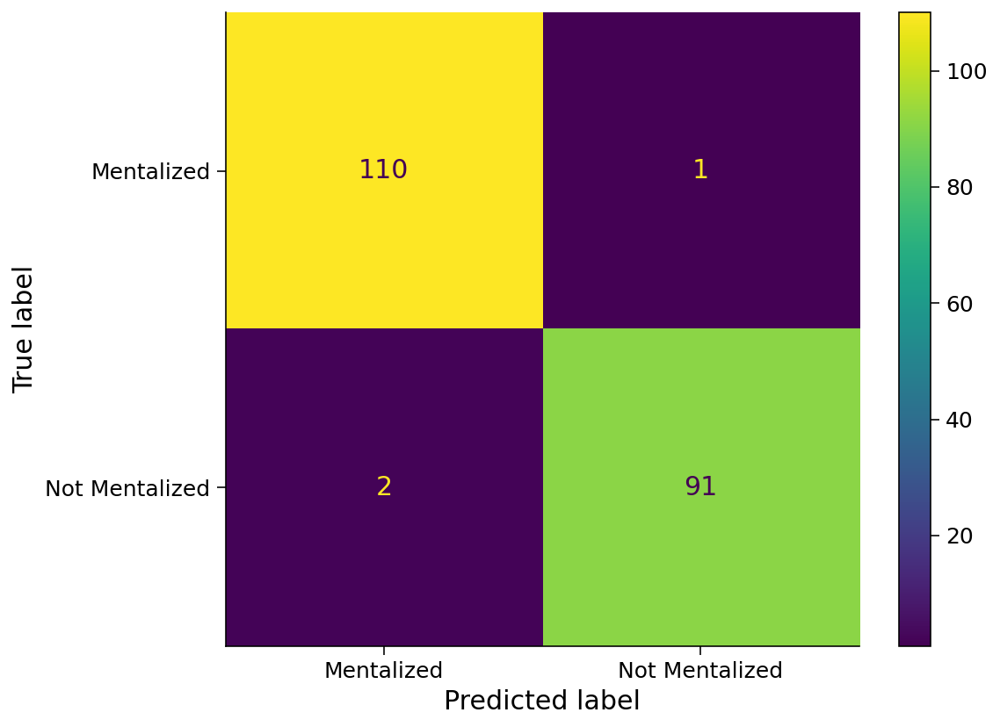

In [110]:
# Machine learning to predict mentalizing
import sklearn
#import tensorflow as tf
#import tensorflow.keras
#from tensorflow.keras.utils import to_categorical
#from sklearn.preprocessing import OneHotEncoder
import numpy as np

# printing shapes for our RespM-M and RespR-R BOLD time series 
print(np.array(final_timeseries_corr).shape)
print(np.array(final_timeseries_random).shape)

data = []
labels = []

# taking mean across timeframes
mental_data = list(np.array(final_timeseries_corr).mean(axis=2))
random_data = list(np.array(final_timeseries_random).mean(axis=2))

# taking parcels only relevant for our study
mental_data_specific = (np.array(final_timeseries_corr).mean(axis=2))[:,rel_parcels]

mean_across_sub_random = (np.array(final_timeseries_random)).mean(axis=2)
random_data_specific = mean_across_sub_random[:,rel_parcels]

#testing by reshaping to 339,360x160
# mental_data_reshaped = np.array(final_timeseries_corr).reshape((339,57600))
# random_data_reshaped = np.array(final_timeseries_random).reshape((339,57600))


print(np.array(mental_data).shape)

# concatenating timeseries and appending labels
for sub in mental_data_specific:
  labels.append(1)
  data.append(sub)
for sub in random_data_specific:
  labels.append(0)
  data.append(sub)

#pca
# from sklearn.decomposition import PCA
# pca = PCA(2)
# projected = pca.fit_transform(data,labels)
# data = projected

#tsne
# from sklearn.manifold import TSNE
# projection = TSNE(random_state=40).fit_transform(data)
# data = projection

# converting them to numpy arrays
data = np.array(data)
labels = np.array(labels)

#splitting into training and test sets
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3,
                                                shuffle=True,random_state=90)
                                              # random_state=90

# y_train = to_categorical(y_train)
# y_test = to_categorical(y_test)

#model instantiation and training, predicting
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=300)                      
fitmodel = model.fit(x_train, y_train)               
y_model = model.predict(x_test)             

# printing and plotting metrics
from sklearn.metrics import accuracy_score, classification_report, plot_confusion_matrix, confusion_matrix, plot_precision_recall_curve, plot_roc_curve
print(accuracy_score(y_test,y_model))
print(classification_report(y_test,y_model,labels=[0,1],target_names=["Mentalized","Not Mentalized"]))

plot_confusion_matrix(model,x_test,y_test, labels=[0,1], display_labels=["Mentalized","Not Mentalized"])
# plot_precision_recall_curve(model,x_test,y_test)
confusion_matrix(y_test,y_model)

In [111]:
# Cross Validation
from numpy import mean,std
from sklearn.model_selection import RepeatedKFold 
from sklearn.model_selection import cross_val_score

# prepare the cross-validation procedure
cv = RepeatedKFold(n_splits=10, n_repeats=3)
# , random_state=1

scores = cross_val_score(model ,data, labels, scoring='accuracy', cv=cv, n_jobs=-1)
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

Accuracy: 0.992 (0.010)


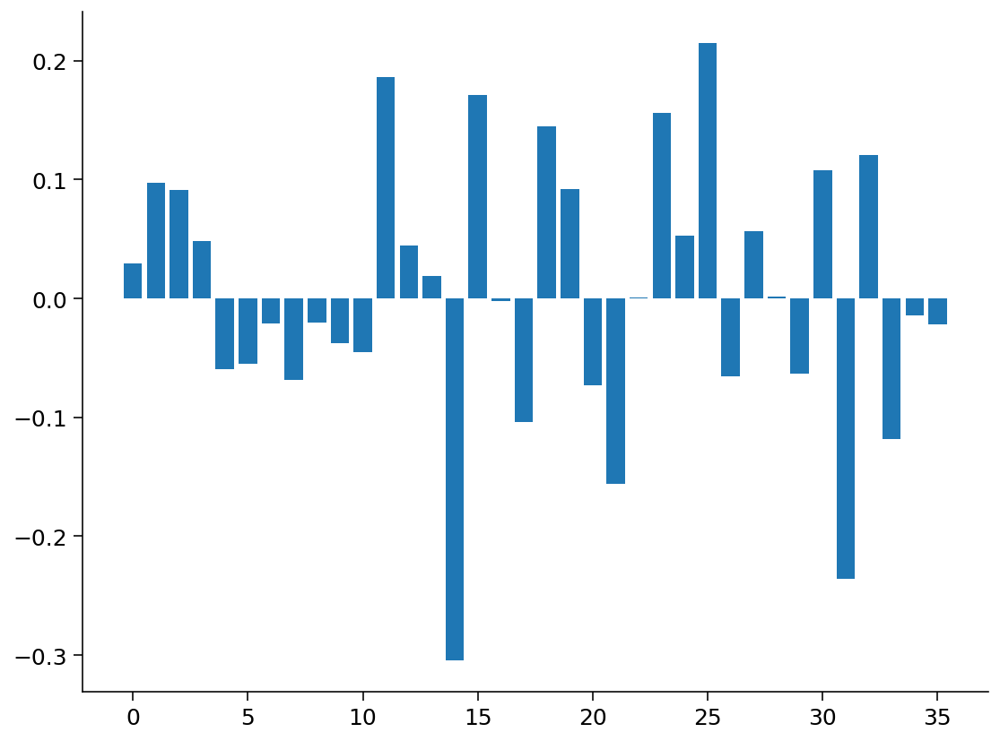

In [112]:
#Plotting coefficients from our logistic regression model
from matplotlib import pyplot
importance = model.coef_[0]

# summarize feature importance
# for i,v in enumerate(importance):
# 	print('Feature: %0d, Score: %.5f' % (i,v))
 
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

### B.3. PCA

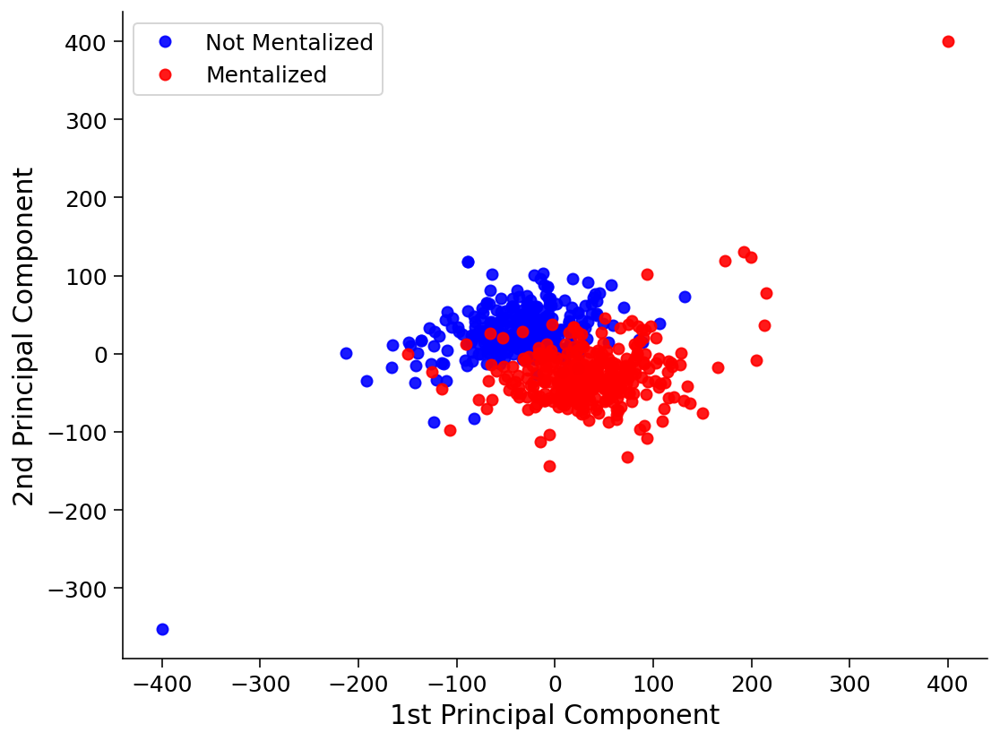

In [113]:
#Using PCA

from sklearn.decomposition import PCA
pca = PCA(2)
# pca.fit(data,labels)
# pca.components_

projected = pca.fit_transform(data,labels)

#clipping data
projected= np.clip(projected, -400, 400)

category_to_color = {0: "Blue", 1: "Red" }
category_to_label = {1: "Mentalized", 0:"Not Mentalized"}

# plt.scatter(projected[:, 0], projected[:, 1],
#             c=labels, edgecolor='none')
# plt.xlabel('1st Principal Component')
# plt.ylabel('2nd Principal Component')

# plot each category with a distinct label
fig, ax = plt.subplots(1,1)
plt.xlabel("1st Principal Component")
plt.ylabel("2nd Principal Component")

for category, color in category_to_color.items():
    mask = labels == category
    ax.plot(projected[mask, 0], projected[mask, 1], 'o', alpha=0.9,
            color=color, label=category_to_label[category])

ax.legend(loc='best')

In [114]:
pca = PCA(5)
# pca.fit(data,labels)
# pca.components_

pca.fit_transform(data,labels)
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[0.37057431 0.19357493 0.08411604 0.03905072 0.03675578]
[0.37057431 0.56414923 0.64826527 0.687316   0.72407178]


In [115]:
# Saving data as csv

from numpy import savetxt
# save to csv file
labels_twodim = np.reshape(labels,(678,1))
final_data = np.concatenate((data, labels_twodim),axis=1)
header2 = ",header"*len(final_data[0])
savetxt('data.csv', final_data, delimiter=',',header=header2[1:])
# np.save('wholedata.npy',final_data)

### B.4. Using KNN instead of Logistic

In [116]:
# Using KNN
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'.format(knn.score(x_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'.format(knn.score(x_test, y_test)))

Accuracy of K-NN classifier on training set: 0.98
Accuracy of K-NN classifier on test set: 0.97


In [117]:
#Plotting the data oints

# import matplotlib.pyplot as plt

# x = np.arange(360)
# y1 = data[0,:]
# y2 = data[474,:]

# print(model.predict(y1.reshape(1,360)))
# print(model.predict(y2.reshape(1,360)))
# print(data.shape)

# plt.scatter(x, y1)
# plt.scatter(x, y2)
# plt.xlabel('Parcels')
# plt.ylabel('BOLD activity')
# plt.axes
# plt.show()

### B.5. 3-D Plot

Text(0.5, 0, 'BOLD Value')

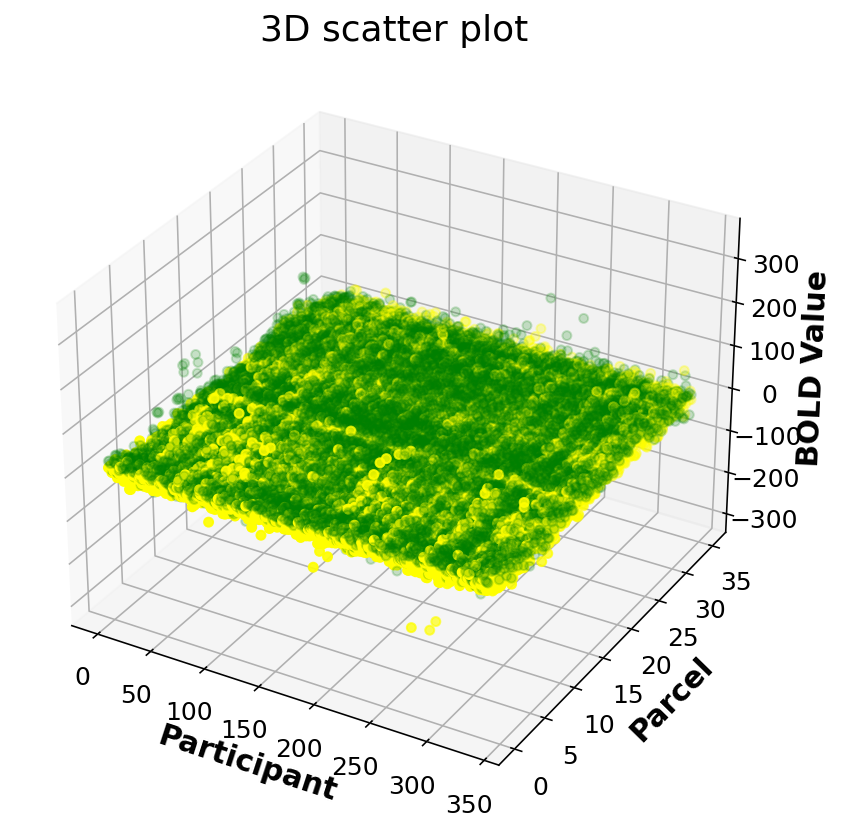

In [118]:
# 3D PLOT
fig = plt.figure()
ax = plt.axes(projection='3d')
n_parcels = 36
for index,p in enumerate(data[:339]):
  ax.scatter3D([index]*n_parcels, list(range(0,n_parcels)),p,c='green',alpha=0.2)

for index,p in enumerate(data[339:]):
  ax.scatter3D([index]*n_parcels, list(range(0,n_parcels)),p,c='yellow')

plt.title("3D scatter plot")
ax.set_xlabel('Participant', fontweight ='bold')
ax.set_ylabel('Parcel', fontweight ='bold')
ax.set_zlabel('BOLD Value', fontweight ='bold')

In [119]:
data[0]

array([ 25.55348038,  26.20048723, -16.94711679, -11.29582117,
       -15.11550182, -18.30869526, -17.3922719 , -12.4094708 ,
       -19.30590785, -24.61104927,   7.56396898,   7.69827555,
        32.98475365,  -0.46526916, -17.30473175,  13.07543796,
        17.64362226,  -1.48111177,  15.26927692,   1.89152737,
        -1.30475137,  -7.1558312 ,   7.17522172,  10.46304243,
        18.52166378,  21.56343339,  31.29878695,  29.92655566,
        23.37390374,  10.01991286,   6.05450912, -19.69577418,
        23.1457208 ,  -3.96630064, -34.16645073,  -8.98903285])

### B.6. t-SNE

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(678, 2)
[[-16.04309    13.926846 ]
 [-12.34692    -1.5179808]
 [-13.850204    5.1020336]
 ...
 [ 22.997503  -23.386635 ]
 [ 28.007534   -8.779693 ]
 [ 21.959513  -17.52691  ]]


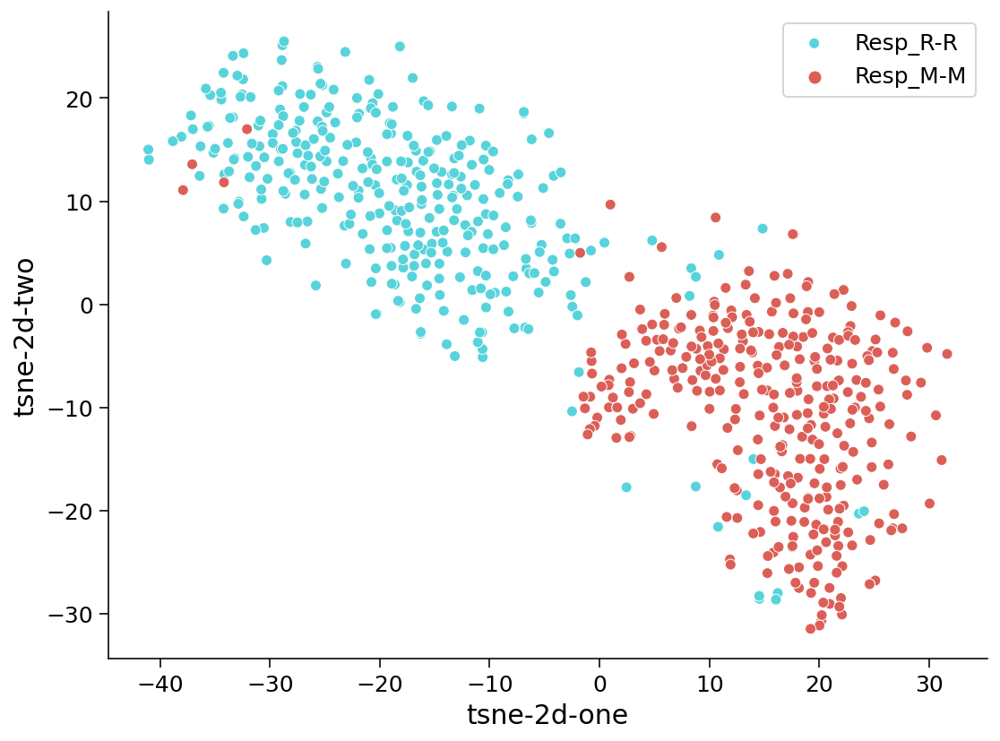

In [120]:
# TSNE #1
from sklearn.manifold import TSNE

data_tsne = TSNE(random_state=40).fit_transform(data)
print(data_tsne.shape)

print(data_tsne)
df_subset = pandas.DataFrame()
df_subset['tsne-2d-one'] = data_tsne[:,0]
df_subset['tsne-2d-two'] = data_tsne[:,1]
df_subset['y'] = labels

#plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 2),
    data=df_subset,
    legend="full",
    alpha=1.0
)

#plt.xlabel("1st Principal Component")
#plt.ylabel("2nd Principal Component")
plt.legend(["Resp_R-R", "Resp_M-M"])

### B.7. WIP: Seeing if Neural Networks mentalize

In [ ]:
# Seeing if Neural Networks mentalize
import cv2
base_model = tf.keras.applications.ResNet50(include_top=False, weights="imagenet", input_tensor=None, input_shape=(224, 224, 3), pooling=None, classes=2)
print(base_model.summary())

encoding = []

# initialize the video stream, pointer to output video file, and
# frame dimensions
vs = cv2.VideoCapture("coaxing.avi")
writer = None
(W, H) = (None, None)
# loop over frames from the video file stream
while True:
    # read the next frame from the file
    (grabbed, frame) = vs.read()
    # if the frame was not grabbed, then we have reached the end
    # of the stream
    if not grabbed:
      break
    # if the frame dimensions are empty, grab them
    if W is None or H is None:
      (H, W) = frame.shape[:2]

    # clone the output frame, then convert it from BGR to RGB
    # ordering, resize the frame to a fixed 224x224, and then
    # perform mean subtraction
    output = frame.copy()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (224, 224)).astype("float32")

    ## STANDARD WAY
    # Image = image.load_img(Image_File, target_size = (150,150))
    # Image_Tensor = image.img_to_array(Image)

    # Extract the Model Outputs for all the Layers
    # Model_Outputs = [layer.output for layer in base_model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    # Activation_Model = base_model(base_model.input, Model_Outputs)

    frame = np.expand_dims(frame,axis=0)
    Activations = base_model.predict(frame)

    ###
    encoding.append(Activations)

In [ ]:
raw_enc = encoding
enc = np.array(encoding) #(331, 1, 7, 7, 2048)
encoding_m = np.mean(enc,axis=0) #(1, 7, 7, 2048)
encoding_m = encoding_m.reshape(7,7,2048)
encoding_mm = np.mean(encoding_m,axis=2)
encoding_mm.shape

from sklearn.linear_model import LinearRegression
# creating an object of LinearRegression class
LR = LinearRegression()
# fitting the training data
LR.fit(encoding_mm,data[:7])

pred = LR.predict(encoding_mm)
pred.shape

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

score=r2_score(data[7:14],pred)
print('r2 score is ',score)
print('mean_sqrd_error is==',mean_squared_error(data[7:14],pred))

In [ ]:
#Using SVM

from sklearn import svm

clf = svm.SVC(kernel='linear') # Linear Kernel
clf.fit(x_train, y_train)                  
y_model = clf.predict(x_test)             

from sklearn.metrics import accuracy_score, classification_report
accuracy_score(y_test, y_model)

# classification_report(y_test,y_model)

## C. Between BOLD data of subjects percieving mental interaction (in mental condition) and resting activity



Nomenclature of BOLD respnses for both conditions

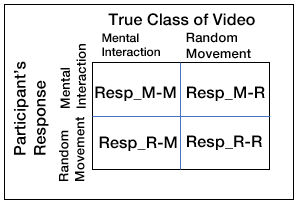

In [121]:
## C. THIS CALCULATES CONTRAST OF Resp_M-M and Rest

#Initializing list of bold values averaged across time, for each parcel for all subjects
avg_rest = []

for subject in subjects:
  #bold values averaged across time, for each parcel, for each subject
  rest_sub = np.mean(timeseries_rest[subject], axis=1)
  avg_rest.append(rest_sub)

#bold values averaged across time and across subjects, for each parcel
avg_rest_sub = np.mean(avg_rest,axis=0)
avg_rest_sub = np.reshape(avg_rest_sub,(360,1))
print(np.array(avg_rest_sub).shape)

(360, 1)


In [122]:
#Contrast between Resp_M-M and Rest Conditions
contrast_c = avgs_m_b - avg_rest_sub
print(contrast_c.shape)

(360, 1)


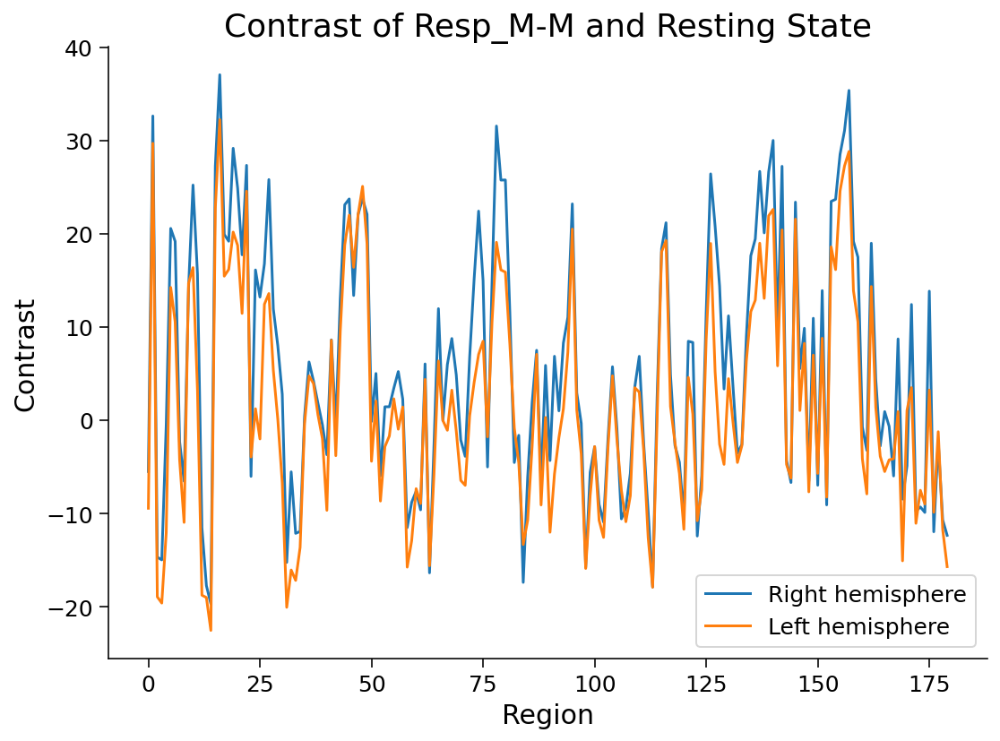

In [123]:
#Plotting graph of contrasts across parcels in both hemispheres
hemi_contra_c = np.split(contrast_c, 2)

for i, hemi_contra_c in enumerate(hemi_contra_c):
  plt.plot(hemi_contra_c, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of Resp_M-M and Resting State")
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

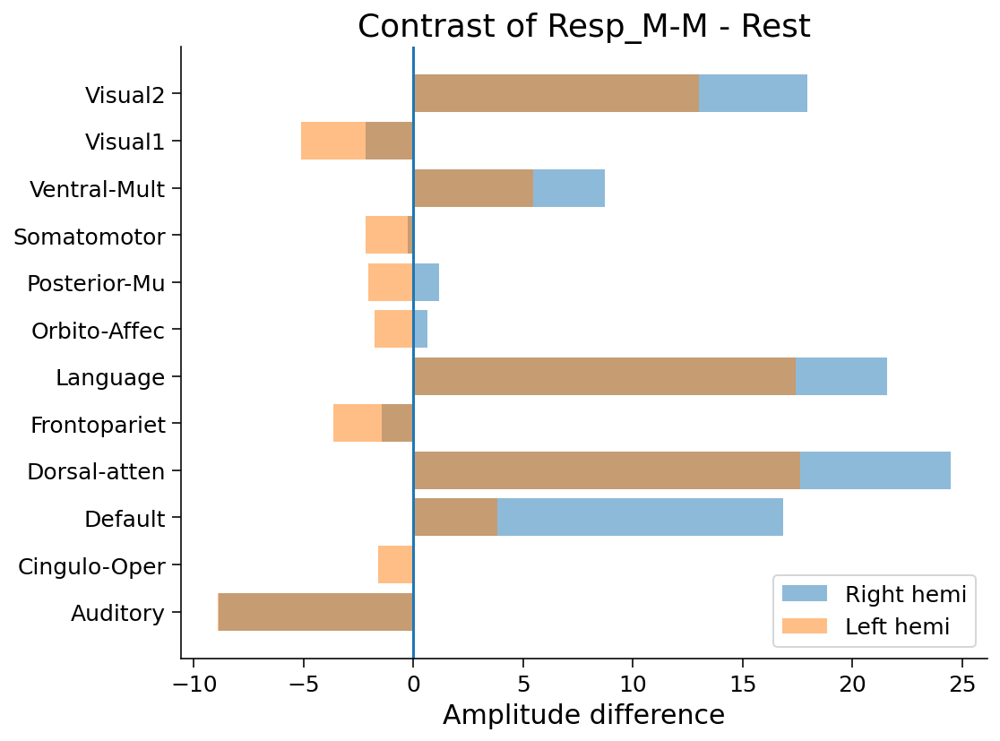

In [124]:

# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contra_c = np.split(contrast_c, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contra_c in zip(HEMIS, hemi_networks, hemi_contra_c):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contra_c[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title(f"Contrast of Resp_M-M - Rest")
plt.legend()
plt.show()

In [125]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast_c = contrast_c[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast_c,
                   vmax=15)

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\nilearn\plotting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))


## D. Between BOLD data of subjects preceving mental interaction (in mental condition) and those perceving random (in mental condition)



Nomenclature of BOLD respnses for both conditions

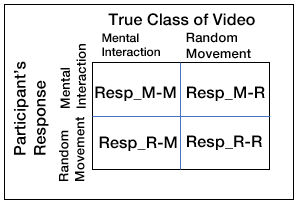

In [126]:
## D. THIS CALCULATES CONTRAST OF Resp_M-M and Resp_R-M

task = "social"

#Initializing time series
r = np.zeros((360,274))
timeseries_random_d = [[r,r]]*339
timeseries_mental_d = [[r,r]]*339

final_timeseries_resp_random_mental = [0]*339

#Initializing average bold values list for both mental and random
avgs_random_d = []
avgs_mental_d = []

#Initializing contrast for Case B
contra_d = []

for subject in subjects:
  ind = int(subject+subject*3)
  # sub =sub.to_numpy()
  sub = social_data[ind:ind+4,0:10]

  #Not needed here as random events are not used in this analysis
  # evs_random = [load_evs(subject, "social", "rnd")]
  # # cond_frame_rnd_0 = condition_frames([load_evs(0, "social", "rnd")[0]])[0]
  # # cond_frame_rnd_1 = condition_frames([load_evs(0, "social", "rnd")[1]])[0]

  evs_mental = [load_evs(subject, "social", "mental")]
  cond_frame_mental_0 = condition_frames([load_evs(0, "social", "mental")[0]])[0]
  cond_frame_mental_1 = condition_frames([load_evs(0, "social", "mental")[1]])[0]


  if sub[0][1]==0 & bool(sub[0][2]=="RANDOM"):
      if sub[0][7]>0.60:  
        timeseries_random_d[subject][0] = np.array(load_timeseries(subject, "social", concat=False, runs=0)[0][:,cond_frame_mental_0])

  if sub[1][1]==0 & bool(sub[1][2]=="TOM"):
      if sub[1][8]>0.60:  
        timeseries_mental_d[subject][0] = np.array(load_timeseries(subject, "social", concat=False, runs=0)[0][:,cond_frame_mental_0])
  
  if sub[2][1]==1 & bool(sub[2][2]=="RANDOM"):
      if sub[2][7]>0.60:  
        timeseries_random_d[subject][1] = np.array(load_timeseries(subject, "social", concat=False, runs=1)[0][:,cond_frame_mental_1])
        
  if sub[3][1]==1 & bool(sub[3][2]=="TOM"):
      if sub[3][8]>0.60:  
        timeseries_mental_d[subject][1] =  np.array(load_timeseries(subject, "social", concat=False, runs=1)[0][:,cond_frame_mental_1])
  
  avgs_random_d.append([selective_average(timeseries_random_d[subject], ev) for ev in evs_mental]) #for subject for run 0 for mental

  avgs_mental_d.append([selective_average(timeseries_mental_d[subject], ev) for ev in evs_mental])

  final_timeseries_resp_random_mental[subject] = np.concatenate((timeseries_random_d[subject][0],timeseries_random_d[subject][1]),axis=1)

for k in subjects:
  avgs_random_d[k] = np.reshape(np.array(avgs_random_d[k]),(360,1))
  avgs_mental_d[k] = np.reshape(np.array(avgs_mental_d[k]),(360,1))

avgs_r_d = np.mean(avgs_random_d, axis=0)
avgs_m_d = np.mean(avgs_mental_d, axis=0)   

# print(condition_frames([load_evs(0, "social", "rnd")[0]])[0])

In [127]:
#Calculating contrast
contra_d = avgs_m_d - avgs_r_d

In [128]:
print(contra_d.shape)

(360, 1)


### D.1. Plotting contrasts in both of the hemisphere

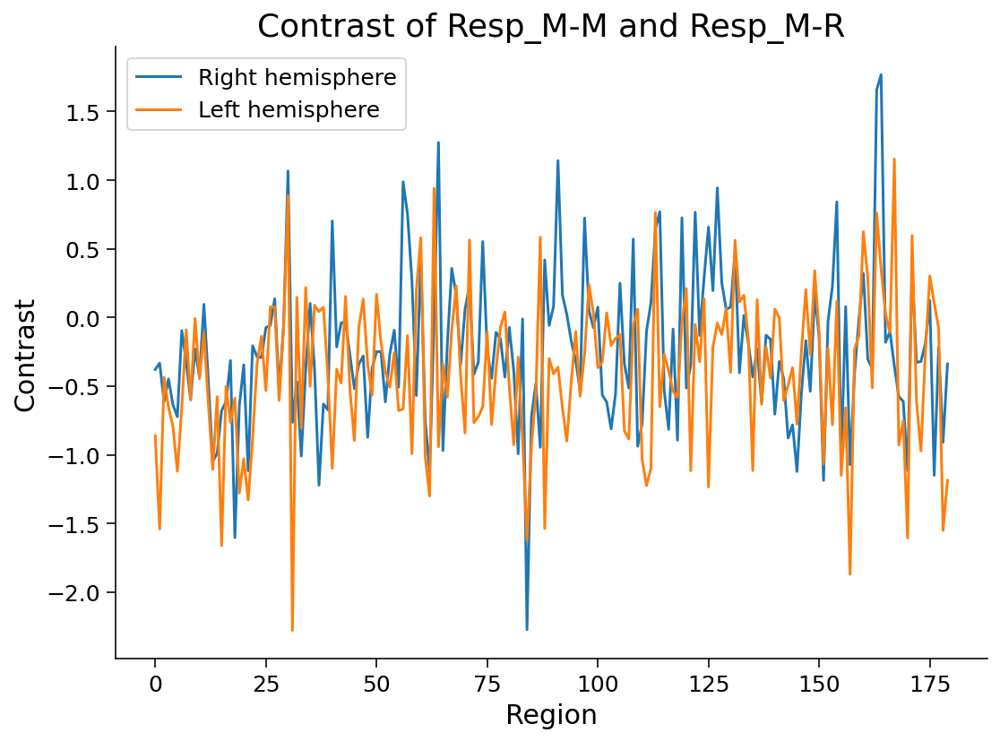

In [129]:
#Plotting contrasts in both of the hemisphere

hemi_contra_d = np.split(contra_d, 2)

for i, hemi_contra_d in enumerate(hemi_contra_d):
  plt.plot(hemi_contra_d, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of Resp_M-M and Resp_M-R")
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

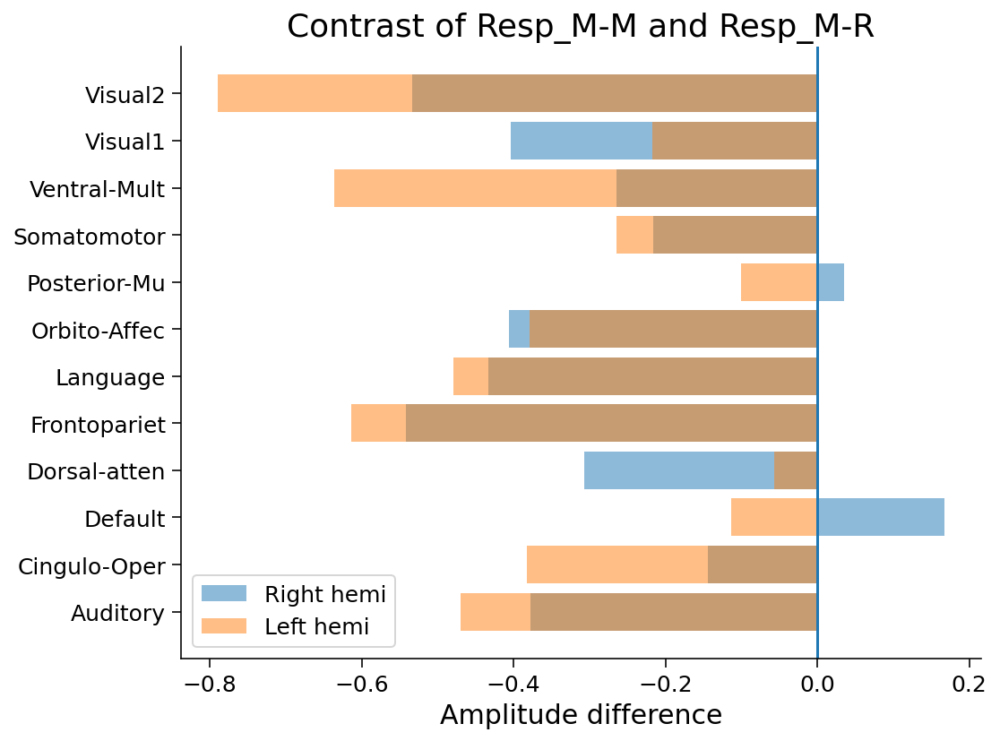

In [130]:
# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contra_d = np.split(contra_d, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contra_d in zip(HEMIS, hemi_networks, hemi_contra_d):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contra_d[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title("Contrast of Resp_M-M and Resp_M-R")
plt.legend()
plt.show()

In [131]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast_d = contra_d[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast_d,
                   vmax=15)

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\nilearn\plotting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))


### D.2. Predicting mentalizing ability by training on Resp_M-M and Resp_R-M

In [132]:
#Predicting mentalizing ability by training on Resp_M-M and Resp_R-M

print(np.array(final_timeseries_corr).shape)
print(np.array(final_timeseries_resp_random_mental).shape)

data = []
labels = []

#testing by taking mean across timeframes
mental_data = list(np.array(final_timeseries_corr).mean(axis=2))
random_data = list(np.array(final_timeseries_resp_random_mental).mean(axis=2))

## taking parcels only relevant for our study
mental_data_specific = (np.array(final_timeseries_corr).mean(axis=2))[:,rel_parcels]

mean_across_sub_random = (np.array(final_timeseries_resp_random_mental)).mean(axis=2)
random_data_specific = mean_across_sub_random[:,rel_parcels]

#testing by reshaping to 339,360x160
mental_data_reshaped = np.array(final_timeseries_corr).reshape((339,57600))
random_data_reshaped = np.array(final_timeseries_resp_random_mental).reshape((339,57600))


print(np.array(mental_data).shape)
#
for sub in mental_data_specific:
  labels.append(1)
  data.append(sub)
for sub in random_data_specific:
  labels.append(0)
  data.append(sub)

data = np.array(data)
# np.reshape(data,(360,160,339))
labels = np.array(labels)


from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3,
                                                shuffle=True,
                                                random_state=90)

# y_train = to_categorical(y_train)
# y_test = to_categorical(y_test)



from sklearn.naive_bayes import GaussianNB 
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=10000)                      
fitmodel = model.fit(x_train, y_train)               
y_model = model.predict(x_test)             

from sklearn.metrics import accuracy_score, classification_report
print(accuracy_score(y_test,y_model))
print(classification_report(y_test,y_model))

(339, 360, 160)
(339, 360, 160)
(339, 360)
0.4117647058823529
              precision    recall  f1-score   support

           0       0.44      0.30      0.35       111
           1       0.40      0.55      0.46        93

    accuracy                           0.41       204
   macro avg       0.42      0.42      0.41       204
weighted avg       0.42      0.41      0.40       204



### D.3. t-SNE

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(678, 2)
[[-16.985378    1.4378294]
 [-20.382244  -39.88557  ]
 [ -5.2946925 -22.842258 ]
 ...
 [  9.317417    9.737876 ]
 [-10.936254    6.278081 ]
 [ 24.68028    29.224472 ]]


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

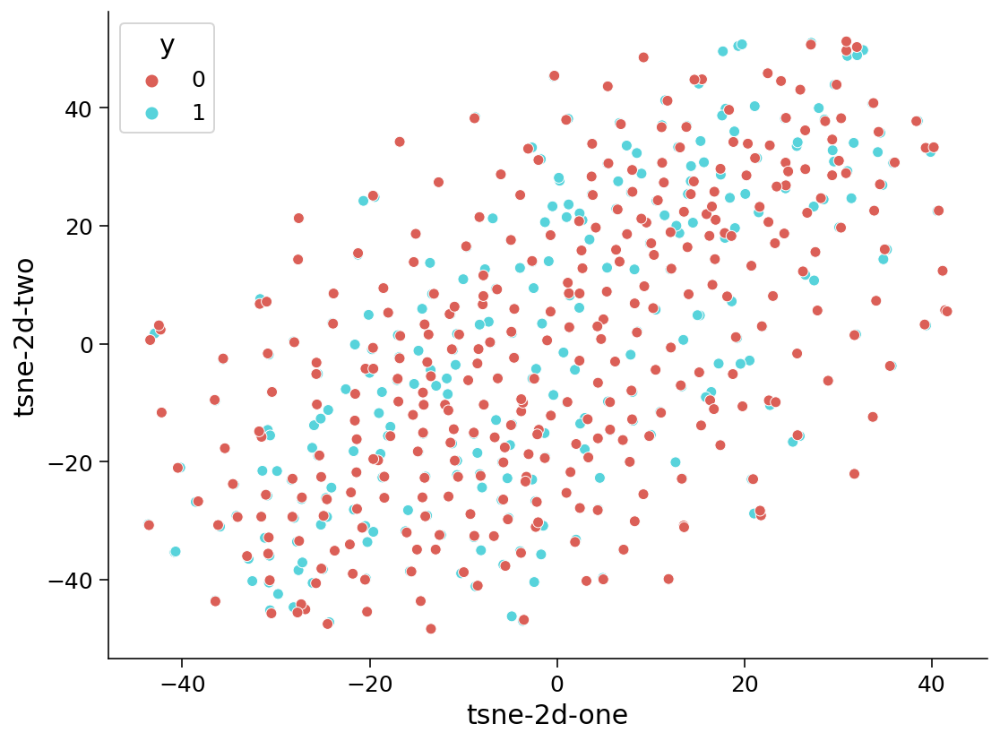

In [133]:
# TSNE #1
from sklearn.manifold import TSNE

data_tsne = TSNE(random_state=40).fit_transform(data)
print(data_tsne.shape)

print(data_tsne)
df_subset = pandas.DataFrame()
df_subset['tsne-2d-one'] = data_tsne[:,0]
df_subset['tsne-2d-two'] = data_tsne[:,1]
df_subset['y'] = labels

#plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 2),
    data=df_subset,
    legend="full",
    alpha=1.0
)

#plt.xlabel("1st Principal Component")
#plt.ylabel("2nd Principal Component")
#plt.legend(["Resp_R-R", "Resp_M-M"])

## OT. Overall Analysis 

In [212]:
print(np.array(final_timeseries_corr).shape)
print(np.array(final_timeseries_resp_random_mental).shape)
print(np.array(final_timeseries_random).shape)

data = []
labels = []

#testing by taking mean across timeframes
mental_data = list(np.array(final_timeseries_corr).mean(axis=2))
random_data = list(np.array(final_timeseries_random).mean(axis=2))
random_r_data = list(np.array(final_timeseries_resp_random_mental).mean(axis=2))
rest_data = list(np.array(timeseries_rest).mean(axis=2))

## taking parcels only relevant for our study
mental_data_specific = (np.array(final_timeseries_corr).mean(axis=2))[:,rel_parcels]

mean_across_sub_random = (np.array(final_timeseries_resp_random_mental)).mean(axis=2)
random_r_data_specific = mean_across_sub_random[:,rel_parcels]

random_data_specific = (np.array(final_timeseries_random).mean(axis=2))[:,rel_parcels]
rest_data_specific = (np.array(timeseries_rest).mean(axis=2))[:,rel_parcels]

#testing by reshaping to 339,360x160
mental_data_reshaped = np.array(final_timeseries_corr).reshape((339,57600))
random_data_reshaped = np.array(final_timeseries_random).reshape((339,57600))
random_r_data_reshaped = np.array(final_timeseries_resp_random_mental).reshape((339,57600))
#rest_data_reshaped = np.array(timeseries_rest).reshape((339,57600))


print(np.array(mental_data).shape)
#
for sub in mental_data_specific: #Resp_M-M
  labels.append(1)
  data.append(sub)
for sub in random_data_specific: #Resp_R-R
  labels.append(0)
  data.append(sub)
for sub in rest_data_specific:
  labels.append(2)
  data.append(sub)
#for sub in random_r_data_specific: #Resp_R-M
#  labels.append(3)
#  data.append(sub)

data = np.array(data)
# np.reshape(data,(360,160,339))
labels = np.array(labels)

(339, 360, 160)
(339, 360, 160)
(339, 360, 160)
(339, 360)


In [213]:
len(data)

1017

C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(1017, 2)
[[ 28.537716    7.0256424]
 [ 22.81889    16.96512  ]
 [ 24.249489   15.774152 ]
 ...
 [ -9.498487  -19.58841  ]
 [-14.703768  -10.540865 ]
 [-15.431202  -23.697453 ]]


C:\Users\Varad Srivastava\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

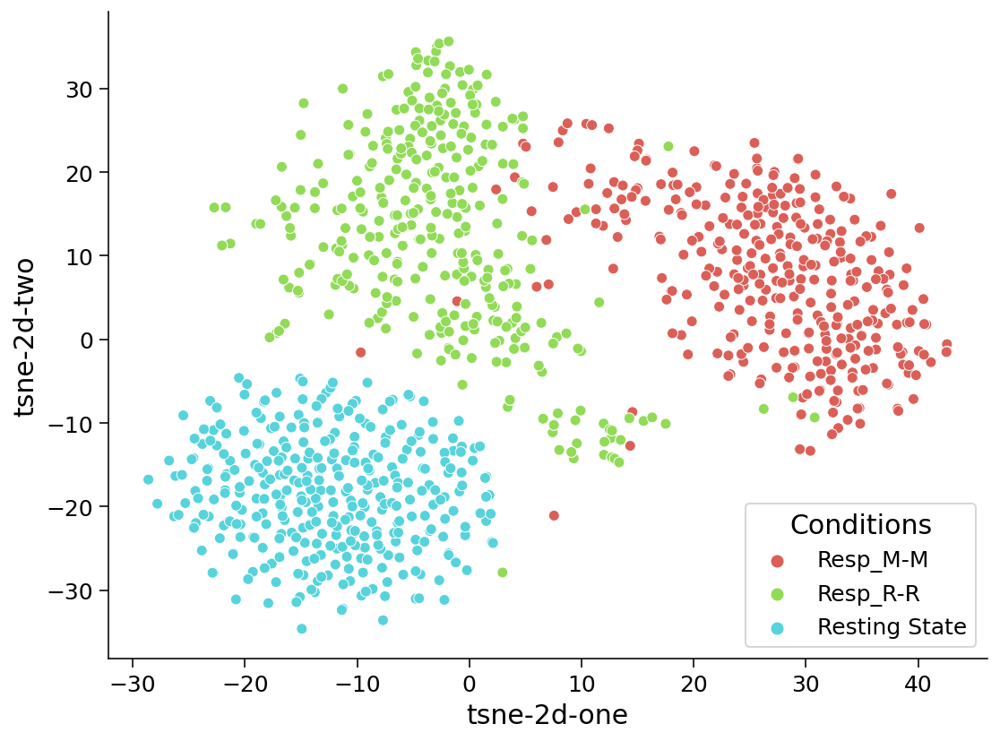

In [214]:
# TSNE #1
from sklearn.manifold import TSNE

data_tsne = TSNE(random_state=40, n_components=2).fit_transform(data)
print(data_tsne.shape)

print(data_tsne)

category_to_labels={0:"Resp_R-R",1:"Resp_M-M",2:"Resting State",3:"Resp_R-M"}

df_subset = pandas.DataFrame()
df_subset['tsne-2d-one'] = data_tsne[:,0]
df_subset['tsne-2d-two'] = data_tsne[:,1]
#df_subset['tsne-3d-three'] = data_tsne[:,2]
df_subset['y'] = labels
df_subset['Conditions'] = df_subset['y'].apply(lambda x: category_to_labels[x])

#plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="Conditions",
    palette=sns.color_palette("hls", 4),
    data=df_subset,
    legend="full",
    alpha=1.0
)

#plt.xlabel("1st Principal Component")
#plt.ylabel("2nd Principal Component")
#plt.legend(labels=["Resp_R-R","Resp_M-M","Resting State","Resp_R-M"])
#plt.show()

KeyError: 'tsne-3d-three'

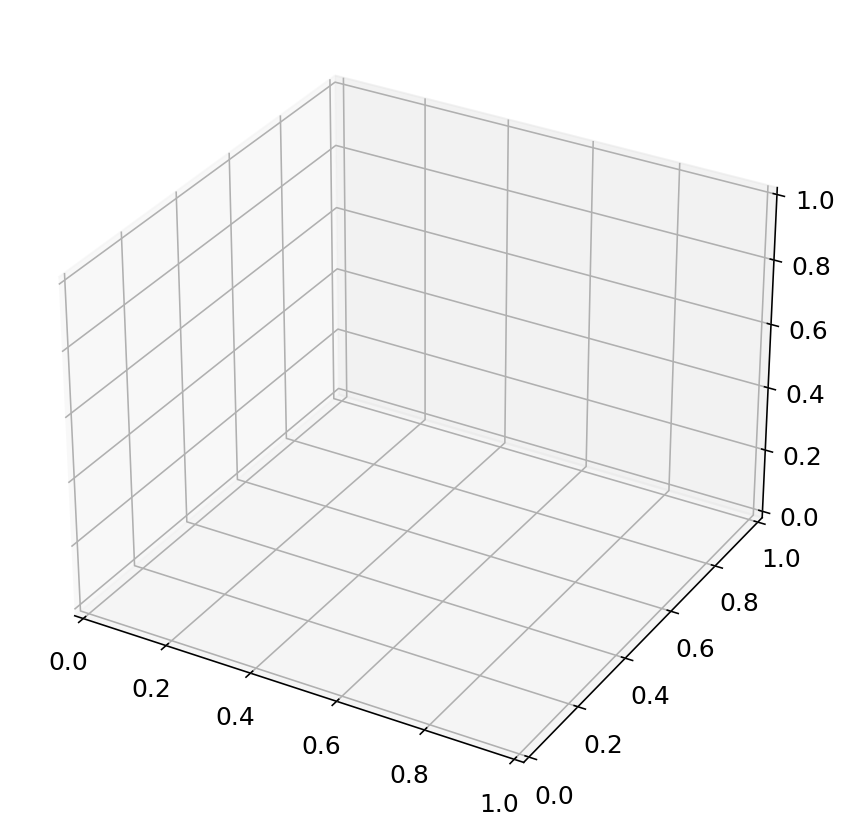

In [136]:
# 3D PLOT
fig = plt.figure()
ax = plt.axes(projection='3d')
n_parcels = 36
#for index,p in enumerate(data[:339]):
#  ax.scatter3D([index]*n_parcels, list(range(0,n_parcels)),p,c='green',alpha=0.2)

#for index,p in enumerate(data[339:]):
#  ax.scatter3D([index]*n_parcels, list(range(0,n_parcels)),p,c='yellow')

ax.scatter3D(xs=df_subset['tsne-3d-one'],ys=df_subset['tsne-3d-two'],zs=df_subset['tsne-3d-three'],c=df_subset['y'])

plt.title("3D scatter plot")
plt.legend()
#ax.set_xlabel('Participant', fontweight ='bold')
#ax.set_ylabel('Parcel', fontweight ='bold')
#ax.set_zlabel('BOLD Value', fontweight ='bold')

In [215]:
#splitting output transformed data from tsne into training and test sets
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data_tsne, labels, test_size=0.3,
                                                shuffle=True,random_state=90)
                                              # random_state=90



In [217]:
# tuning parameter/hyper parameter (k)

"""
When K is small, we are restraining the region of a given prediction and forcing our classifier to be 
“blind” to the overall distribution. A small value for K provides the most flexible fit, which will have 
low bias but high variance. Graphically, our decision boundary will be more jagged. 
On the other hand, a higher K averages more points in each prediction and hence is more resilient to outliers. 
Larger values of K will have smoother decision boundaries which mean lower variance but increased bias.
"""

#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.model_selection import cross_val_score

k_range = range(1,40)
scores = {}
error_rate = {}

for k in k_range:
    
    #Create KNN Classifier
    knn = KNeighborsClassifier(n_neighbors=k)

    score = cross_val_score(knn, data_tsne, labels, cv=10)
    
    scores[k] = score.mean()
    error_rate[k] = 1-score.mean()
    
print(error_rate)

{1: 0.029479712677150105, 2: 0.028518734226363862, 3: 0.02654824305960024, 4: 0.025567850902737277, 5: 0.023607066589011794, 6: 0.02066589011842357, 7: 0.024587458745874535, 8: 0.022626674432149052, 9: 0.022626674432149052, 10: 0.02066589011842357, 11: 0.02066589011842357, 12: 0.02066589011842357, 13: 0.02066589011842357, 14: 0.02164628227528631, 15: 0.02164628227528631, 16: 0.02164628227528631, 17: 0.02066589011842357, 18: 0.02164628227528631, 19: 0.02164628227528631, 20: 0.022626674432149052, 21: 0.02164628227528631, 22: 0.023607066589011794, 23: 0.02164628227528631, 24: 0.022626674432149052, 25: 0.02066589011842357, 26: 0.023607066589011794, 27: 0.02164628227528631, 28: 0.023607066589011794, 29: 0.022626674432149052, 30: 0.023607066589011794, 31: 0.022626674432149052, 32: 0.023607066589011794, 33: 0.022626674432149052, 34: 0.022626674432149052, 35: 0.02164628227528631, 36: 0.022626674432149052, 37: 0.022626674432149052, 38: 0.023607066589011794, 39: 0.024587458745874535}


In [221]:
minval = min(error_rate.values())
res = [k for k, v in error_rate.items() if v==minval]
print(res)

[6, 10, 11, 12, 13, 17, 25]


Text(0, 0.5, 'Error rate')

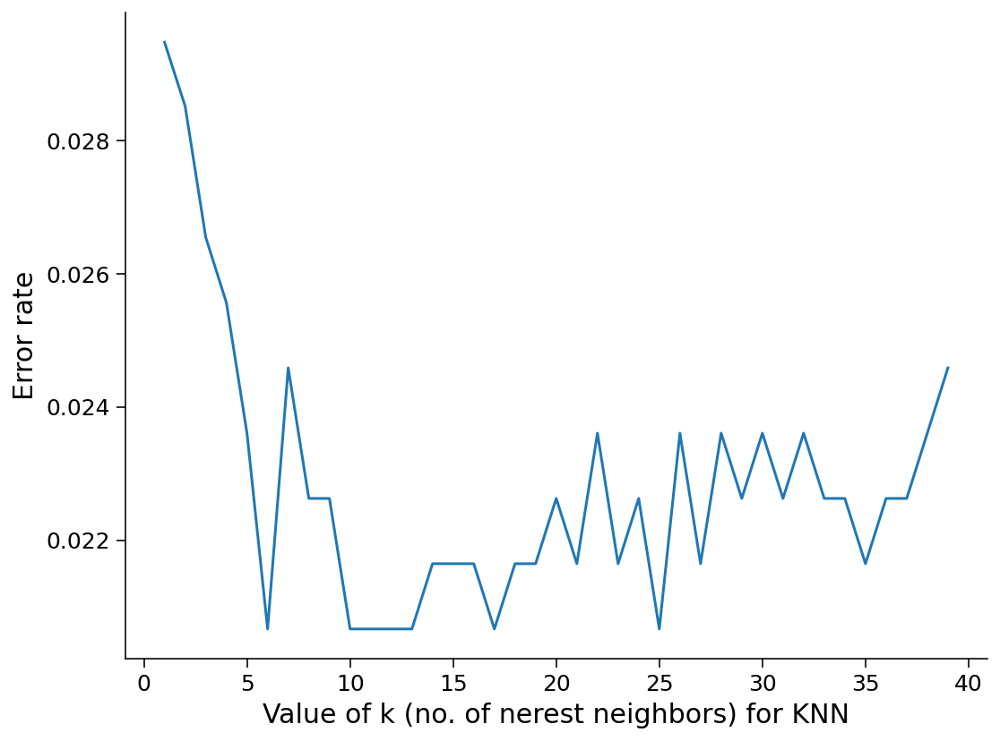

In [220]:
"""
In general the Training accuracy rises as the model complexity increases, for KNN the model complexity is 
determined by the value of K. Larger K value leads to smoother decision boundary (less complex model). 
Smaller K leads to more complex model (may lead to overfitting). Testing accuracy penalizes models that 
are too complex(over fitting) or not complex enough(underfit). We get the maximum testing accuracy when the 
model has right level of complexity, in our case we can see that for a K value of 5 to 9 our model accuracy is 96.6%.
"""

plt.plot(error_rate.keys(), error_rate.values())
plt.xlabel("Value of k (no. of nerest neighbors) for KNN")
plt.ylabel("Error rate")

In [222]:
"""
Final Model
"""


#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=11)

#Train the model using the training sets
knn.fit(x_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(x_test)

In [223]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9771241830065359


(array([-40., -30., -20., -10.,   0.,  10.,  20.,  30.,  40.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

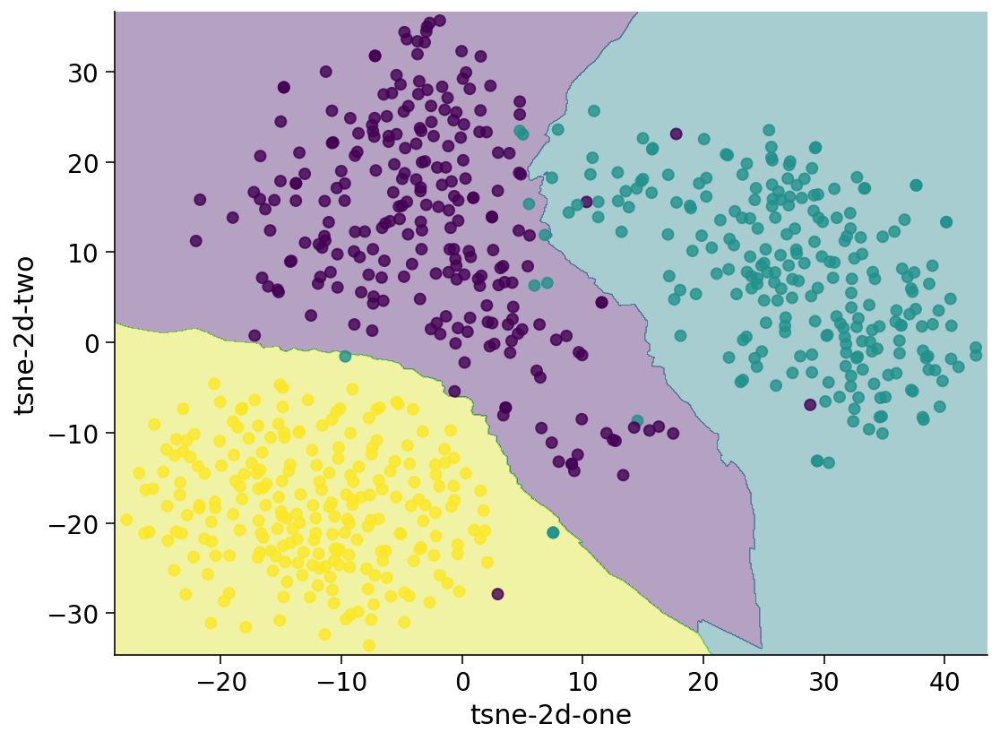

In [227]:
"""
Decision boundaries learnt from train data?
"""

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, m_max]x[y_min, y_max].    

X = np.array(x_train)
Y = np.array(y_train).flatten()

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
# Meshgrid creation
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# Obtain labels for each point in mesh using the model
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

# Plotting
plt.contourf(xx, yy, Z, alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, alpha=0.8)
plt.xlabel("tsne-2d-one",fontsize=15)
plt.ylabel("tsne-2d-two",fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

(array([-40., -30., -20., -10.,   0.,  10.,  20.,  30.,  40.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

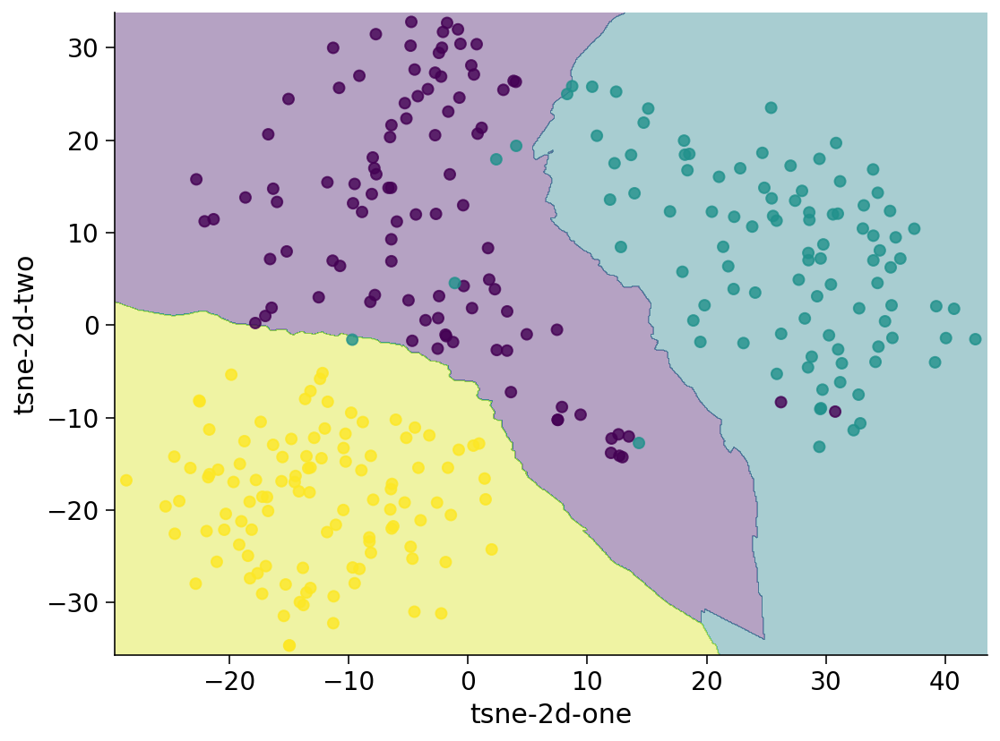

In [228]:
"""
Decision boundaries of the knn trained model on test data
"""

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, m_max]x[y_min, y_max].    

X = np.array(x_test)
Y = np.array(y_test).flatten()

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
# Meshgrid creation
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# Obtain labels for each point in mesh using the model
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

# Plotting
plt.contourf(xx, yy, Z, alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, alpha=0.8)
plt.xlabel("tsne-2d-one",fontsize=15)
plt.ylabel("tsne-2d-two",fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

0.9771241830065359
[[ 97   2   0]
 [  4  94   1]
 [  0   0 108]]
                precision    recall  f1-score   support

Not Mentalized       0.96      0.98      0.97        99
    Mentalized       0.98      0.95      0.96        99
 Resting State       0.99      1.00      1.00       108

      accuracy                           0.98       306
     macro avg       0.98      0.98      0.98       306
  weighted avg       0.98      0.98      0.98       306



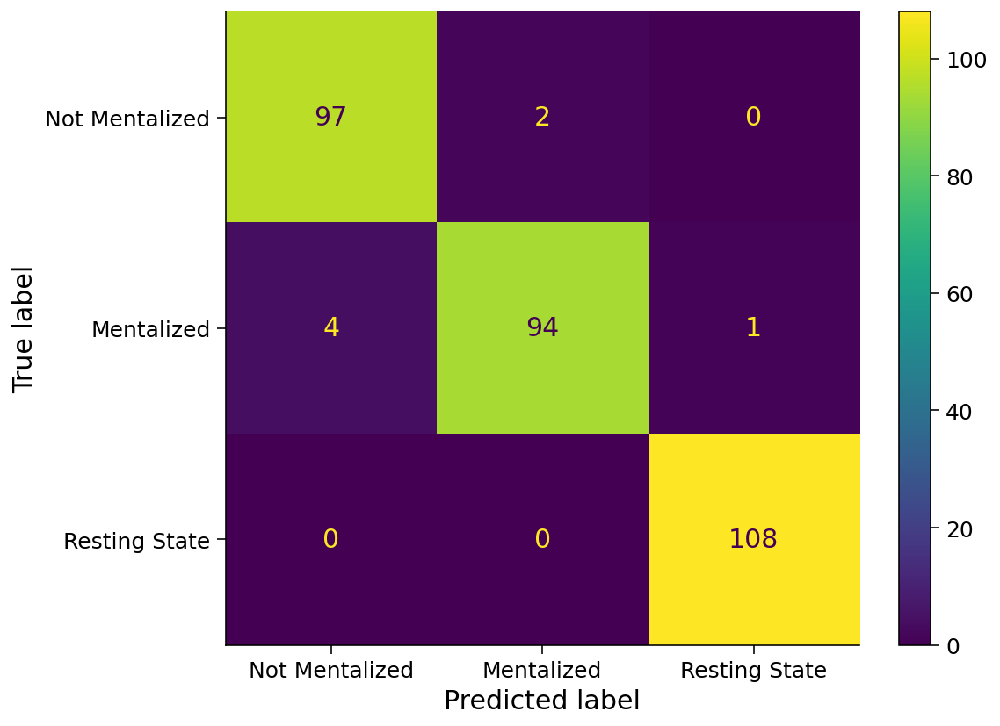

In [229]:
# printing and plotting metrics
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, confusion_matrix
print(accuracy_score(y_pred,y_test))

cm = confusion_matrix(y_test, y_pred, labels = knn.classes_)
print(cm)

print(classification_report(y_test,y_pred,labels=[0,1,2],target_names=["Not Mentalized","Mentalized", "Resting State"]))

cm_d = ConfusionMatrixDisplay(cm, display_labels = ["Not Mentalized","Mentalized", "Resting State"])
cm_d.plot()